# CS-GY 6643 Project 2 | OCT 31, 2025

### Aditya Jhaveri 
N13689134 | aaj6301@nyu.edu

### Sanyukta Tuti
N18689585 | st5442@nyu.edu

# Q1 PART-A

# Runway Boundary Detection using OpenCV and Hough Transform

This document explains the steps executed by the Python script to detect and isolate the main runway boundary lines in an image using computer vision techniques.

---

## 1. Preprocessing: Load and Grayscale Conversion

The script first prepares the image for feature extraction:

1.  **Image Loading:** The input image (`filename`) is loaded into memory as a color image (`src_color`) for final display.
2.  **Grayscale Conversion:** The color image is immediately converted to **grayscale** (`src_gray`) using `cv.cvtColor()`.
    * **Reason:** Edge detection algorithms perform more reliably and efficiently on grayscale images, focusing only on intensity variations rather than complex color data.

---

## 2. Feature Extraction: Canny Edge Detection

The script isolates structural outlines using the industry-standard **Canny Edge Detector**:

* **Canny Function:** `edges = cv.Canny(src_gray, 50, 200, None, 3)`
* **Process:** The Canny algorithm applies Gaussian smoothing, computes image gradients, and uses **hysteresis thresholding** (controlled by 50 and 200) to find strong, continuous edge contours.
* **Result:** The output `edges` is a binary image containing only the detected structural boundaries, which is the required input for the Hough Transform.

---

## 3. Geometric Detection: Probabilistic Hough Line Transform

The script uses a specialized algorithm to find line segments within the edge map:

* **Function:** `cv.HoughLinesP()` is used, which stands for the **Probabilistic Hough Transform**.
* **Efficiency:** This version is more efficient than the standard Hough Transform as it samples a subset of points, returning the endpoints $(x_1, y_1, x_2, y_2)$ of confirmed line segments.
* **Line Constraints:** Parameters like `minLineLength=50` and `maxLineGap=10` are used to ensure that only reasonably long and continuous segments are considered as valid lines.

---

## 4. Selection and Filtering

This is the critical step for isolating the runway boundaries from all other detected lines (e.g., lights, distant horizon):

1.  **Angle Calculation:** The angle of each detected line is calculated based on its endpoints.
2.  **Steepness Filter:** A strong geometric filter is applied: `if 60 < angle < 120`.
    * **Reason:** Lines representing the runway boundaries, viewed in perspective down the length of the runway, will appear **near-vertical** (steep) in the image plane. This filter eliminates horizontal (horizon) and diagonal lines.
3.  **Sorting by Length:** The remaining candidate lines are sorted in **descending order** based on their physical length (`length = np.sqrt(...)`).
4.  **Final Selection:** The **top two longest lines** (`candidate_lines[:2]`) are selected, as they are the most likely candidates for the main runway boundaries.

---

## 5. Visualization

The process concludes by visualizing the results:

* The two selected lines are drawn onto the original color image (`runway_img`) in a contrasting **green** color.
* `matplotlib` is used to display the three key stages—**Grayscale Image**, **Canny Edges**, and the **Detected Runway Lines**—side-by-side for a complete overview of the process.

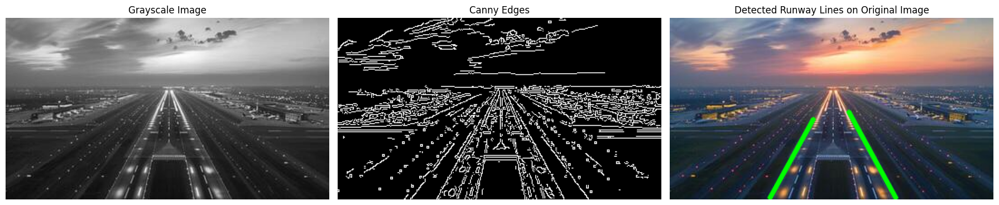

In [5]:
import sys
import math
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# File path
filename = 'data/runway-lights-leading-to-airport-terminal-at-sunset-photo.jpeg'

# Load original image in color
src_color = cv.imread(filename)
if src_color is None:
    print("Error opening image!")
    sys.exit()

# Also load grayscale for edge detection
src_gray = cv.cvtColor(src_color, cv.COLOR_BGR2GRAY)

# Canny edge detection
edges = cv.Canny(src_gray, 50, 100, None, 3)

# Probabilistic Hough Line Transform
linesP = cv.HoughLinesP(edges, 1, np.pi / 180, 50, None, minLineLength=50, maxLineGap=10)

# Prepare a copy of the original image to draw runway lines
runway_img = src_color.copy()

# Collect candidate lines
candidate_lines = []

if linesP is not None:
    for line in linesP:
        x1, y1, x2, y2 = line[0]
        length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
        # Compute angle in degrees
        angle = abs(np.degrees(np.arctan2((y2 - y1), (x2 - x1))))
        # Keep only steep lines (~ vertical)
        if 60 < angle < 120:
            candidate_lines.append((x1, y1, x2, y2, length, angle))

    # Sort by length descending
    candidate_lines.sort(key=lambda x: x[4], reverse=True)

    # Pick the two longest lines (likely runway boundaries)
    selected_lines = candidate_lines[:2]

    # Draw them on the original image
    for (x1, y1, x2, y2, length, angle) in selected_lines:
        cv.line(runway_img, (x1, y1), (x2, y2), (0, 255, 0), 4, cv.LINE_AA)

# Display the results inline
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(src_gray, cmap='gray')
plt.title("Grayscale Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title("Canny Edges")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(runway_img, cv.COLOR_BGR2RGB))
plt.title("Detected Runway Lines on Original Image")
plt.axis('off')

plt.tight_layout()
plt.show()

# Q1 PART-B

# Circle Detection using Hough Transform (OpenCV)

This Python script processes three GIF images, each containing various circles, and uses the **Hough Circle Transform** from the OpenCV library to detect and highlight these circular shapes.

---

## 1. Image Preprocessing

The script iterates through the list of image files, performing initial setup:

1.  **Loading and Grayscale Conversion:** Images are loaded using PIL (`Image.open`) and immediately converted to **grayscale** (`.convert('L')`). This is necessary because OpenCV's `HoughCircles` function typically requires a single-channel image.
2.  **Color Conversion:** The grayscale image is copied and converted back to a **3-channel color image** (`cv.cvtColor(..., cv.COLOR_GRAY2BGR)`). This is done solely to allow the detected circles to be drawn in color (green and red) for visualization.
3.  **Noise Reduction (Gaussian Blur):** A **Gaussian Blur** (`cv.GaussianBlur(..., (7, 7), 2)`) is applied.
    * **Reason:** Blurring reduces high-frequency noise and helps to smooth the edges, which is crucial for the gradient calculation used by the Hough method. The kernel size of $(7, 7)$ and standard deviation of $2$ provide significant smoothing.

---

## 2. Hough Circle Transform (Hough Gradient Method)

The core detection is performed using `cv.HoughCircles()`, which implements the **Hough Gradient Method** (a more efficient variation of the standard Hough Transform).

### Key Parameters and Rationale

| Parameter | Value | Description | Rationale for Choice |
| :--- | :--- | :--- | :--- |
| `method` | `cv.HOUGH_GRADIENT` | The detection method. | Most robust and common method for real-world images. |
| `dp` | $1.2$ | Inverse ratio of accumulator resolution to image resolution. | A value slightly greater than $1$ (e.g., $1.2$) makes the accumulator grid slightly coarser, speeding up detection and generally working well for defined shapes. |
| `minDist` | $30$ | Minimum distance between the centers of the detected circles. | Set to $30$ pixels to ensure that multiple circles that are very close together (and likely represent the same object) are not detected as separate entities. |
| `param1` | $90$ | High threshold for the Canny edge detector internally used by the function. | Set relatively high (near $100$) because the input circles appear to have **strong, clean edges**, meaning a high gradient is expected at the circumference. |
| `param2` | $75$ | Accumulator threshold for the center detection. | Set relatively high (near $75$) to require a **stronger consensus** among edge points before a circle is confirmed. This helps filter out spurious detections in images with clear circles. |
| `minRadius` | $15$ | Minimum radius of circles to be detected. | Set to $15$ pixels to exclude very small, insignificant, or noisy artifacts. |
| `maxRadius` | $80$ | Maximum radius of circles to be detected. | Set to $80$ pixels based on the visual expectation that the largest circles in the input images will not exceed this size. |

---

## 3. Post-Processing and Annotation

1.  **Data Formatting:** The detected circle coordinates are converted to `np.uint16` and rounded using `np.around()`.
2.  **Filtering:** An additional filter (`if r > 10`) is applied, which is redundant given `minRadius=15` but serves as a quick check against any extremely small, unexpected detections.
3.  **Drawing:** For each confirmed circle, two items are drawn on the color image:
    * A **green circle** (`(0, 255, 0)`) is drawn to outline the detected circumference.
    * A **red circle** (`(0, 0, 255)`) is drawn at the center to mark the location.
4.  **Output:** The total number of detected circles for each file is printed to the console.

---

## 4. Visualization

A $3 \times 2$ grid plot is generated using `matplotlib.pyplot` to visually compare the results:

* **Left Column:** The original grayscale image.
* **Right Column:** The annotated image showing the detected circles outlined in green with red centers.

data/circles1.gif: 8 circles detected
data/circles2.gif: 8 circles detected
data/circles3.gif: 8 circles detected


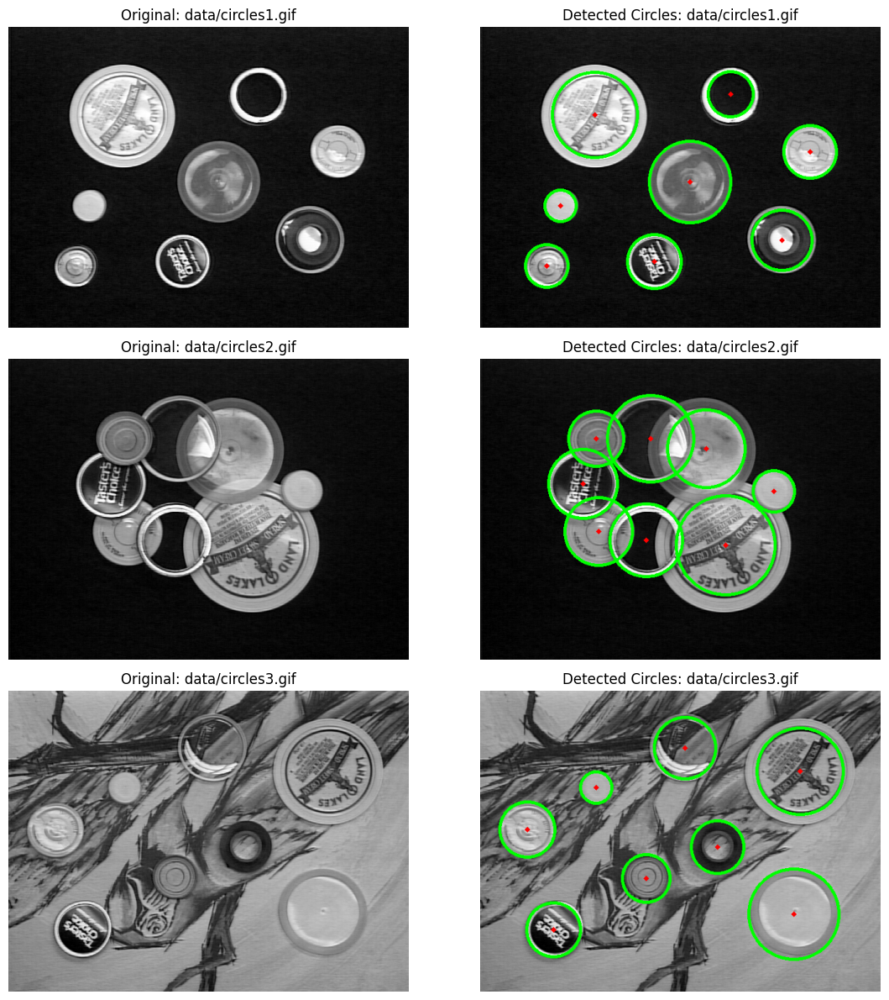

In [6]:
from PIL import Image
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

# List of GIF images
image_files = [
    'data/circles1.gif',
    'data/circles2.gif',
    'data/circles3.gif'
]

# Prepare lists to store original and annotated images
original_images = []
annotated_images = []

for filename in image_files:
    # Load GIF grayscale
    pil_img = Image.open(filename).convert('L')
    img_gray = np.array(pil_img)
    
    # Keep original for plotting
    original_images.append(img_gray)
    
    # Convert to color for drawing
    img_color = cv.cvtColor(img_gray, cv.COLOR_GRAY2BGR)
    
    # Gaussian blur to reduce noise
    img_blur = cv.GaussianBlur(img_gray, (7, 7), 2)
    
    # Hough Circle Transform
    circles = cv.HoughCircles(
        img_blur,
        cv.HOUGH_GRADIENT,
        dp=1.2,
        minDist=30,
        param1=90,
        param2=75,
        minRadius=15,
        maxRadius=80
    )
    
    detected_circles = []
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for c in circles[0, :]:
            x, y, r = c
            if r > 10:  # filter tiny spurious circles
                detected_circles.append(c)
                cv.circle(img_color, (x, y), r, (0, 255, 0), 3)
                cv.circle(img_color, (x, y), 2, (0, 0, 255), 3)
    
    print(f"{filename}: {len(detected_circles)} circles detected")
    annotated_images.append(img_color)

# Plotting all images
plt.figure(figsize=(12, 12))

for i in range(len(image_files)):
    # Original image
    plt.subplot(len(image_files), 2, 2*i+1)
    plt.imshow(original_images[i], cmap='gray')
    plt.title(f"Original: {image_files[i]}")
    plt.axis('off')
    
    # Annotated image
    plt.subplot(len(image_files), 2, 2*i+2)
    plt.imshow(cv.cvtColor(annotated_images[i], cv.COLOR_BGR2RGB))
    plt.title(f"Detected Circles: {image_files[i]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Q2.

# Augmented Reality: Book Cover Replacement via Homography

This document explains the computer vision pipeline used to solve the **Augmented Reality: Book Cover Replacement** task. The core goal is to detect the position and perspective of a source book cover in a scene and seamlessly superimpose a new target cover onto that region using a **Homography** transformation.

---

## 1. Feature Detection and Description (ORB)

The process begins by identifying stable, reliable features on both the template (the source cover) and the scene (the desk image).

* **Detector/Descriptor:** The **ORB (Oriented FAST and Rotated BRIEF)** algorithm is chosen for its efficiency and robustness in detecting corner-like keypoints and computing binary descriptors.
    * `orb = cv.ORB_create(5000)`: Limits the number of features to 5,000 to keep computation fast.
* **Keypoint Extraction:** `orb.detectAndCompute()` is applied to the grayscale template (`template_gray`) and the grayscale scene (`scene_gray`) to get their keypoints (`kp1`, `kp2`) and descriptors (`des1`, `des2`).

---

## 2. Feature Matching and Filtering

Correspondences between the two images are found by matching their descriptors.

* **Matcher:** A **Brute-Force Matcher (`cv.BFMatcher`)** is used with `cv.NORM_HAMMING`, the appropriate distance metric for ORB's binary descriptors.
* **Quality Control:** The `crossCheck=True` flag is crucial. It enforces **bi-directional matching**, meaning a feature A on image 1 must be the best match for feature B on image 2, and feature B must also be the best match for feature A. This significantly reduces false matches.
* **Sorting:** Matches are sorted by their distance, keeping the closest (best quality) matches at the beginning of the list. The top matches are used for the subsequent steps.

---

## 3. Homography Calculation (RANSAC)

A **Homography matrix ($H$)** is computed, which defines the geometric transformation required to map the flat template plane onto the book's tilted plane in the scene.

1.  **Extract Points:** The coordinates of the matched keypoints are extracted from the sorted list into `src_pts` (template coordinates) and `dst_pts` (scene coordinates).
2.  **`cv.findHomography()`:** This function calculates the $3 \times 3$ matrix $H$.
    * **RANSAC (Random Sample Consensus):** This method is essential for robustness. It iteratively calculates $H$ using random subsets of points and selects the matrix that aligns the largest number of matches (**inliers**), effectively filtering out the remaining **outliers** (incorrect matches). The threshold is set to $5.0$ pixels.

---

## 4. Augmented Reality Overlay

The final steps use the calculated Homography ($H$) to perform the seamless replacement.

1.  **Target Resizing:** The `target_cover` ("Harry Potter") is resized to match the dimensions of the `template_cover` ("Computer Vision") to ensure the perspective warps correctly based on the template's dimensions.
2.  **Perspective Warping:** `cv.warpPerspective()` uses the Homography matrix $H$ to transform the resized target cover, projecting it onto the scene at the exact position and perspective of the original book. The result is `warped_target`.
3.  **Masking and Blending:**
    * The corners of the target cover in the scene are found using `cv.perspectiveTransform()`.
    * A mask is created by filling the shape defined by these corners.
    * The original scene is preserved everywhere **outside** the mask (`scene_bg`).
    * The final image (`final\_img`) is created by combining the preserved scene background and the newly **warped target cover** using `cv.add()`.

This process results in a single, augmented image where the "Harry Potter" cover appears seamlessly superimposed on the physical book.

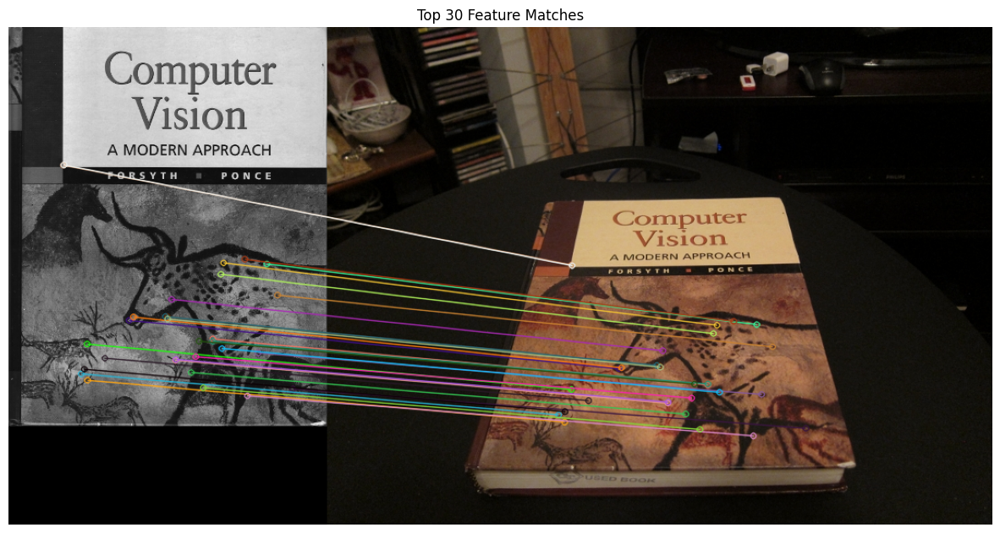

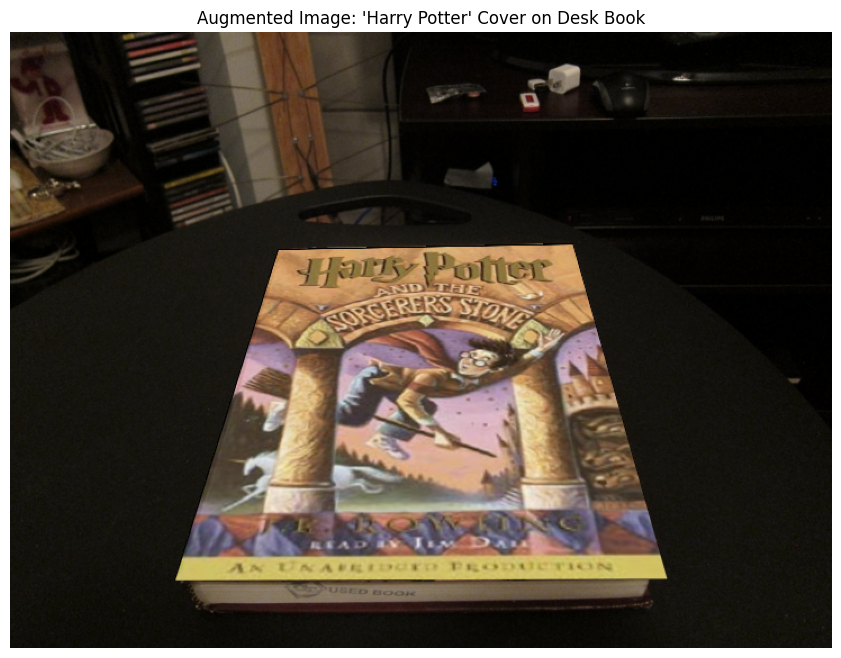

In [7]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Load images
scene_img = cv.imread('data/cv_desk.png')        # Original desk image
template_cover = cv.imread('data/cv_cover.jpg')  # Source book cover
target_cover = cv.imread('data/hp_cover.jpg')    # Target book cover

# Convert to grayscale
scene_gray = cv.cvtColor(scene_img, cv.COLOR_BGR2GRAY)
template_gray = cv.cvtColor(template_cover, cv.COLOR_BGR2GRAY)

# Step 1: Detect ORB keypoints and descriptors
orb = cv.ORB_create(5000)
kp1, des1 = orb.detectAndCompute(template_gray, None)
kp2, des2 = orb.detectAndCompute(scene_gray, None)

# Step 2: Match descriptors using BFMatcher with Hamming distance
bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
matches = sorted(matches, key=lambda x: x.distance)

# Optional: draw top matches for verification
matched_img = cv.drawMatches(template_cover, kp1, scene_img, kp2, matches[:30], None, flags=2)
plt.figure(figsize=(15, 8))
plt.imshow(cv.cvtColor(matched_img, cv.COLOR_BGR2RGB))
plt.title("Top 30 Feature Matches")
plt.axis('off')
plt.show()

# Step 3: Extract matched keypoints
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

# Step 4: Compute Homography
H, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC, 5.0)

# Step 5: Warp target cover to the scene
h, w, _ = template_cover.shape
# Resize target cover to match template
target_cover_resized = cv.resize(target_cover, (template_cover.shape[1], template_cover.shape[0]))

# Warp resized target cover
warped_target = cv.warpPerspective(target_cover_resized, H, (scene_img.shape[1], scene_img.shape[0]))

# Step 6: Create mask and overlay
mask = np.zeros((scene_img.shape[0], scene_img.shape[1]), dtype=np.uint8)
pts = np.float32([[0,0],[w,0],[w,h],[0,h]]).reshape(-1,1,2)
dst = cv.perspectiveTransform(pts, H)
cv.fillConvexPoly(mask, np.int32(dst), 255)

# Invert mask for background
mask_inv = cv.bitwise_not(mask)
scene_bg = cv.bitwise_and(scene_img, scene_img, mask=mask_inv)
final_img = cv.add(scene_bg, warped_target)

# Show final augmented image
plt.figure(figsize=(12,8))
plt.imshow(cv.cvtColor(final_img, cv.COLOR_BGR2RGB))
plt.title("Augmented Image: 'Harry Potter' Cover on Desk Book")
plt.axis('off')
plt.show()

# Q3

# Panorama Stitching Pipeline - Code Explanation

# Overview
This is a panoramic image stitching pipeline that combines multiple overlapping images into a single seamless panorama. It handles distorted images, aligns them using feature matching, and blends them together. The pipeline uses computer vision techniques like feature detection, KNN matching, RANSAC homography estimation, and weighted blending to create a high-quality panoramic output.

## Key Components

### Configuration & Setup
The pipeline is configured to load 6 image parts from the `data` directory. Two of these images—`part2` and `part3`—are marked as distorted and require special geometric correction before they can be stitched with the others. All images are loaded and resized to a consistent height (600px) to ensure robustness across different image sizes.

### Utility Functions

#### Image Display & Loading

- `imshow_rgb()` displays images in RGB format using matplotlib. It converts BGR color space (OpenCV default) to RGB for proper visualization, handling figure size and titles.
- `check_and_load()` loads all images from disk, validates that files exist and that OpenCV successfully reads them, and resizes them to a consistent height while maintaining aspect ratio using bilinear interpolation.

#### Feature Detection

- `make_detector()` creates either a SIFT or ORB feature detector. SIFT is preferred because it's more robust and scale-invariant, but the code falls back to ORB (Oriented FAST and Rotated BRIEF) if SIFT is not available in the OpenCV installation.
- `detect_and_compute()` converts an image to grayscale and extracts keypoints (feature locations) and their corresponding descriptors (feature representations) using the chosen detector algorithm.

#### Feature Matching

- `match_knn_ratio()` performs K-Nearest Neighbors (KNN) matching between descriptor sets from two images with k=2. It applies Lowe's ratio test (0.75) to filter ambiguous matches: only keeps a match if the distance to the closest neighbor is significantly smaller than the distance to the second-closest neighbor.
- This ratio test dramatically reduces false matches and improves the quality of homography estimation. It uses L2 norm for SIFT descriptors and Hamming distance for ORB descriptors.

#### Homography Calculation

- `find_hom_raphy_ransac()` finds the geometric transformation (3×3 homography matrix) that maps points from one image to another using RANSAC (Random Sample Consensus). RANSAC is robust to outliers by iteratively selecting random subsets of matches, computing homographies, and keeping the one that produces the most inliers.
- Returns the homography matrix H, the keypoints from both images, the matched feature pairs, and an inlier mask indicating which matches are geometrically consistent.

## Pipeline Steps

### Step A: Fix Distorted Images
Since `part2` and `part3` are geometrically distorted, they must be corrected before the main stitching process begins:

- **For part2**: The algorithm tries matching it to both `part1` and `part3` separately, computing a homography for each reference. It selects the reference that produces the most RANSAC inliers, as more inliers indicate a more reliable geometric match.
- **For part3**: After part2 is fixed, part3 is corrected using the now-reliable part2 and part4 as reference images, again selecting the reference with the highest inlier count.
- **Warp & Blend**: The distorted image is transformed into the reference frame using perspective warping. A combined canvas accommodates both the warped distorted image and the reference, and overlapping regions are blended together by taking the non-zero pixels (simple averaging where regions overlap).

### Step B: Compute Global Alignment
All images are registered to a common coordinate system by mapping them to a global reference (the middle image, index 3):

- **Direct matching**: For each image, the algorithm attempts to compute a homography directly to the reference image using feature matching and RANSAC.
- **Chaining**: If direct matching fails (e.g., due to insufficient keypoint matches), the algorithm chains intermediate homographies. For example, if image 0 cannot match directly to image 3, it computes: image 0 → image 1, then image 1 → image 2, then image 2 → image 3, multiplying the homography matrices to get the final transformation.
- Each image now has a computed homography `H_to_ref[i]` that transforms it into the reference coordinate system.

### Step C: Calculate Output Canvas
The dimensions and position of the final panorama canvas are determined by transforming all image corners:

- The four corners of each image are transformed using their respective homographies to the reference frame, projecting them into the common coordinate system.
- All transformed corners are collected and their bounding box (minimum and maximum x and y coordinates) defines the total spatial extent needed.
- An offset is calculated to shift all coordinates to positive values (avoiding negative array indices), and the output canvas size is computed as `(xmax - xmin) × (ymax - ymin)`.

### Step D: Warp & Blend Images
Each image is warped into the final canvas and their contributions are blended:

- **Warping**: For each image with a valid homography, a perspective transformation is applied using the combined homography (canvas translation + reference mapping).
- **Masking**: A binary mask is created for each warped image, marking pixels with valid data (non-black) as 1 and black pixels as 0.
- **Accumulation**: The weighted pixel values and masks are accumulated across all images. Overlapping regions receive contributions from multiple images.
- **Normalization**: The final panorama is computed by dividing the accumulated pixel values by the accumulated weights, effectively averaging overlapping regions for seamless blending.

### Step E: Crop Black Borders
The final panorama contains black padding around the edges from regions not covered by any input image:

- The panorama is converted to grayscale and thresholded to create a binary mask where any non-black pixels are marked as foreground.
- The contours of the foreground region are found, and the bounding rectangle is extracted.
- The panorama is cropped to remove the black padding, leaving only the content region.

### Step F: Reporting
The pipeline reports which images were successfully used in the final panorama and which were skipped:

- Images with valid homographies are listed as "used" and contributed to the final output.
- Images with failed homography computation are listed as "skipped," indicating they could not be registered to the reference frame (e.g., due to insufficient feature matches or geometric inconsistencies).

## Output
**Final Result**: A seamlessly stitched panoramic image that combines all input images with corrected geometric distortions, smooth blending at seam regions, and automatic removal of black borders. The panorama is ready for display or further processing.

Loading images...
Loaded 6 images.
Using detector: SIFT

Fixing part2 (index 1)...
Dist 1 -> Ref 0: matches=375 inliers=331 H_exists=True
Dist 1 -> Ref 2: matches=260 inliers=227 H_exists=True
Applied warp for part2, info: (0, 331)


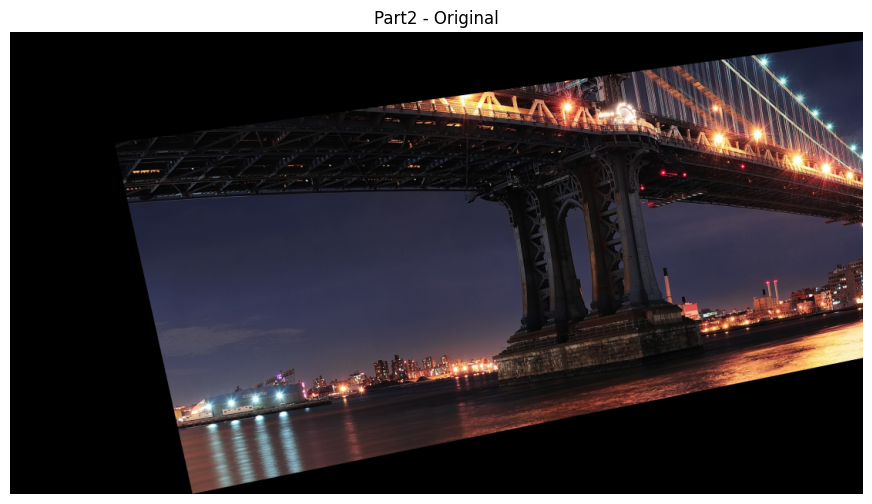

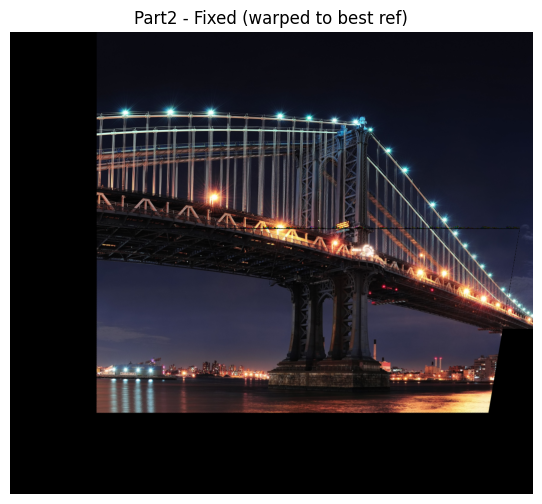


Fixing part3 (index 2)...
Dist 2 -> Ref 1: matches=415 inliers=387 H_exists=True
Dist 2 -> Ref 3: matches=202 inliers=169 H_exists=True
Applied warp for part3, info: (1, 387)


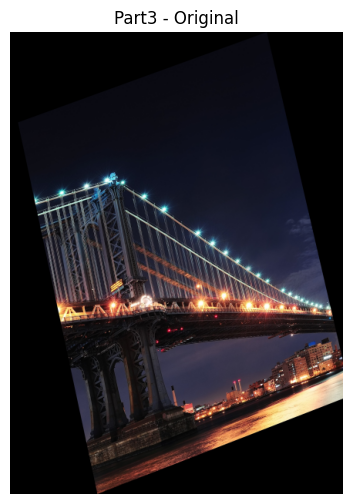

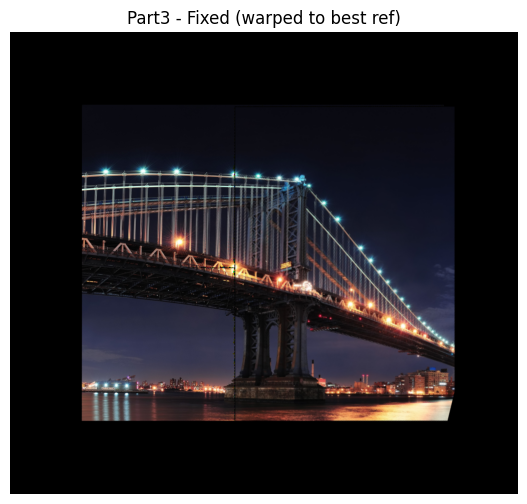


Using image index 3 as global reference for the mosaic.
Computed H for image 0 -> ref 3
Computed H for image 1 -> ref 3
Computed H for image 2 -> ref 3
Computed H for image 3 -> ref 3
Computed H for image 4 -> ref 3
Computed H for image 5 -> ref 3
Canvas bounds: -711 -268 1805 763
Output canvas size: 2516 1031
Images used in final panorama (indices): [0, 1, 2, 3, 4, 5]
Images skipped (no mapping to ref): []


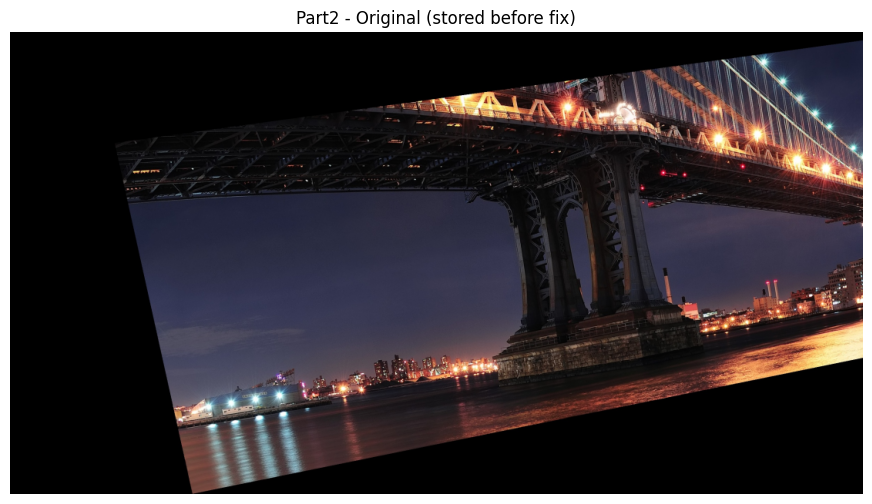

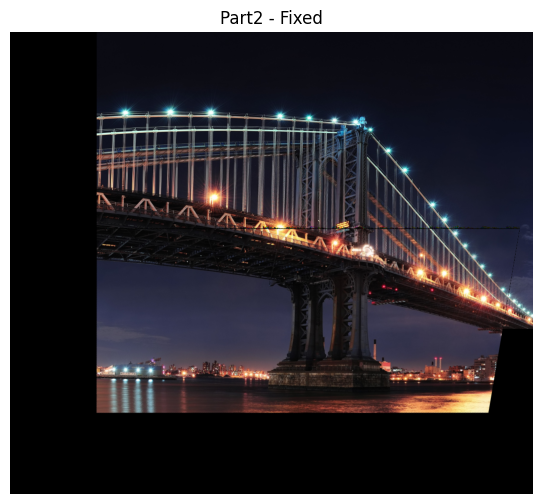

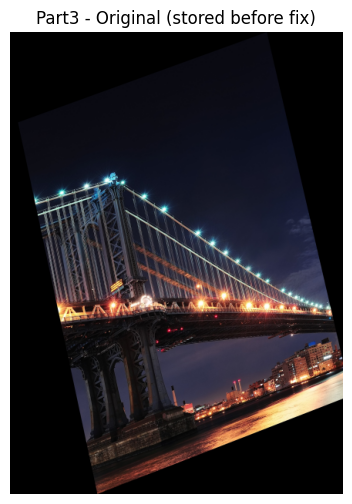

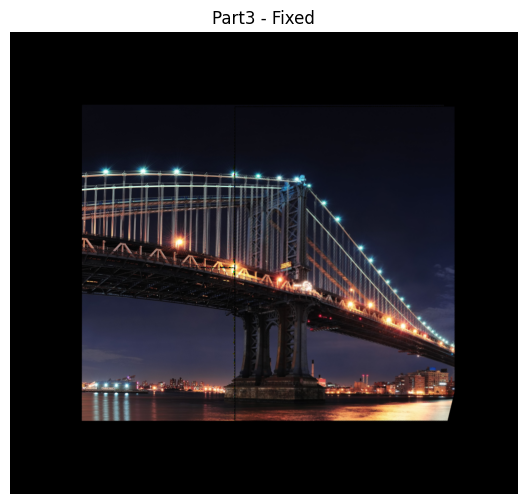

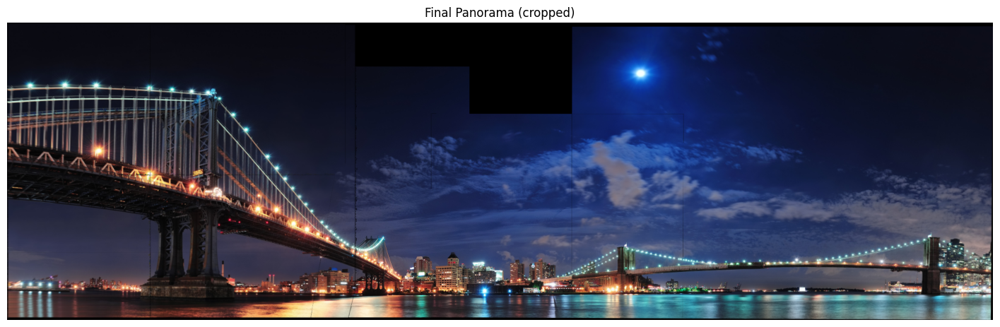

In [8]:
# fresh_panorama_pipeline.py
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ----------------------- Config -----------------------
DATA_DIR = "data"
files = [
    "new-york-city_part1.jpg",
    "new-york-city_part2_DISTORTED.jpg",
    "new-york-city_part3_DISTORTED.jpg",
    "new-york-city_part4.jpg",
    "new-york-city_part5.jpg",
    "new-york-city_part6.jpg"
]
paths = [os.path.join(DATA_DIR, f) for f in files]

# ----------------------- Utilities -----------------------
def imshow_rgb(img, title="", figsize=(12,6)):
    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()

def check_and_load(paths, resize_height=None):
    imgs = []
    for p in paths:
        if not os.path.exists(p):
            raise FileNotFoundError(f"Missing file: {p}")
        im = cv2.imread(p)
        if im is None:
            raise RuntimeError(f"cv2 failed to load: {p}")
        if resize_height is not None:
            h = im.shape[0]
            if h != resize_height:
                scale = resize_height / h
                im = cv2.resize(im, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
        imgs.append(im)
    return imgs

# Try to create SIFT, otherwise fallback to ORB
def make_detector():
    if hasattr(cv2, "SIFT_create"):
        return ("SIFT", cv2.SIFT_create())
    else:
        return ("ORB", cv2.ORB_create(5000))

def detect_and_compute(img, detector):
    typ, det = detector
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if typ == "SIFT":
        kp, des = det.detectAndCompute(gray, None)
    else:
        # ORB returns keypoints and descriptors
        kp, des = det.detectAndCompute(gray, None)
    return kp, des

def match_knn_ratio(des1, des2, detector_type, ratio=0.75):
    if des1 is None or des2 is None:
        return []
    if detector_type == "SIFT":
        matcher = cv2.BFMatcher(cv2.NORM_L2)
    else:
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING)
    raw = matcher.knnMatch(des1, des2, k=2)
    good = []
    for m_n in raw:
        if len(m_n) != 2:
            continue
        m, n = m_n
        if m.distance < ratio * n.distance:
            good.append(m)
    return good

def find_homography_ransac(img_src, img_dst, detector, ratio=0.75, ransac_thresh=5.0, min_matches=8):
    """
    Find homography mapping src -> dst using detector (SIFT/ORB),
    returns H, kp_src, kp_dst, matches, inlier_mask
    """
    kp1, des1 = detect_and_compute(img_src, detector)
    kp2, des2 = detect_and_compute(img_dst, detector)
    if des1 is None or des2 is None:
        return None, kp1, kp2, [], None
    matches = match_knn_ratio(des1, des2, detector[0], ratio=ratio)
    if len(matches) < min_matches:
        return None, kp1, kp2, matches, None
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_thresh)
    return H, kp1, kp2, matches, mask

# ----------------------- Load images -----------------------
print("Loading images...")
imgs = check_and_load(paths, resize_height=600)   # resize to consistent height for robustness
N = len(imgs)
print(f"Loaded {N} images.")

detector = make_detector()
print("Using detector:", detector[0])

# ----------------------- Step A: Fix distorted images (part2 index=1, part3 index=2) -------
# Strategy: for part2 try refs [part1, part3]; choose homography with most inliers.
# Then for part3 use refs [part2_fixed, part4].
# ----------------------- Step A: Fix distorted images (part2 index=1, part3 index=2) -------
# Strategy: for part2 try refs [part1, part3]; choose homography with most inliers.
# Then for part3 use refs [part2_fixed, part4].
def choose_best_reference_and_warp(dist_idx, ref_indices):
    best_inliers = 0
    best_H = None
    best_ref_idx = None
    best_pair_info = None

    dist = imgs[dist_idx]

    for ref_idx in ref_indices:
        ref = imgs[ref_idx]

        # Detect keypoints and descriptors
        kp_dist, des_dist = detect_and_compute(dist, detector)
        kp_ref, des_ref = detect_and_compute(ref, detector)

        if des_dist is None or des_ref is None:
            continue

        # Match descriptors
        matches = match_knn_ratio(des_dist, des_ref, detector[0], ratio=0.75)
        if len(matches) < 6:
            continue

        # Extract matched points
        pts_dist = np.float32([kp_dist[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
        pts_ref  = np.float32([kp_ref[m.trainIdx].pt  for m in matches]).reshape(-1,1,2)

        # Compute homography
        H, mask = cv2.findHomography(pts_dist, pts_ref, cv2.RANSAC, 5.0)
        if H is None or mask is None:
            continue

        inliers = int(mask.sum())
        print(f"Dist {dist_idx} -> Ref {ref_idx}: matches={len(matches)} inliers={inliers} H_exists={H is not None}")

        if inliers > best_inliers:
            best_inliers = inliers
            best_H = H
            best_ref_idx = ref_idx
            best_pair_info = (kp_ref, kp_dist, matches, mask)

    if best_H is None:
        print(f"Could not find valid homography for distorted image {dist_idx}")
        return None, None

    # Warp distorted image into reference frame
    ref = imgs[best_ref_idx]
    h_ref, w_ref = ref.shape[:2]
    h_dist, w_dist = dist.shape[:2]

    # Compute canvas bounds to avoid cropping
    corners = np.float32([[0,0],[w_dist,0],[w_dist,h_dist],[0,h_dist]]).reshape(-1,1,2)
    warped_corners = cv2.perspectiveTransform(corners, best_H)
    all_corners = np.concatenate((warped_corners, np.float32([[0,0],[w_ref,0],[w_ref,h_ref],[0,h_ref]]).reshape(-1,1,2)), axis=0)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    trans = [-xmin, -ymin]

    H_translate = np.array([[1,0,trans[0]],[0,1,trans[1]],[0,0,1]])
    warped = cv2.warpPerspective(dist, H_translate @ best_H, (xmax - xmin, ymax - ymin))

    # Paste reference into same canvas without cutting
    ty, tx = trans[1], trans[0]
    out_h, out_w = warped.shape[:2]
    y1 = max(0, ty)
    x1 = max(0, tx)
    y2 = min(out_h, ty + h_ref)
    x2 = min(out_w, tx + w_ref)
    ref_y1 = max(0, -ty)
    ref_x1 = max(0, -tx)
    ref_y2 = ref_y1 + (y2 - y1)
    ref_x2 = ref_x1 + (x2 - x1)

    if y2 > y1 and x2 > x1:
        ref_region = ref[ref_y1:ref_y2, ref_x1:ref_x2]
        warped[y1:y2, x1:x2] = np.where(
            warped[y1:y2, x1:x2]==0, ref_region, warped[y1:y2, x1:x2]
        )

    return warped, (best_ref_idx, best_inliers)

# Fix part2 (index 1)
print("\nFixing part2 (index 1)...")
warped2, info2 = choose_best_reference_and_warp(1, [0,2])
if warped2 is not None:
    orig2 = imgs[1].copy()
    imgs[1] = warped2
    print("Applied warp for part2, info:", info2)
    imshow_rgb(orig2, "Part2 - Original")
    imshow_rgb(imgs[1], "Part2 - Fixed (warped to best ref)")

# Fix part3 (index 2); choose refs [part2_fixed(1), part4(3)]
print("\nFixing part3 (index 2)...")
warped3, info3 = choose_best_reference_and_warp(2, [1,3])
if warped3 is not None:
    orig3 = imgs[2].copy()
    imgs[2] = warped3
    print("Applied warp for part3, info:", info3)
    imshow_rgb(orig3, "Part3 - Original")
    imshow_rgb(imgs[2], "Part3 - Fixed (warped to best ref)")

# ----------------------- Step B: Compute homographies to a common reference -----------------------
# Choose center image index as reference
ref_idx = N // 2  # middle
print("\nUsing image index", ref_idx, "as global reference for the mosaic.")

# helper to compute H(i->ref). We try direct match; if fail, attempt chaining via neighbors
def compute_H_to_ref(i, ref_idx, imgs, detector):
    if i == ref_idx:
        return np.eye(3)
    # try direct
    H_direct, *_ = find_homography_ransac(imgs[i], imgs[ref_idx], detector, ratio=0.75, ransac_thresh=5.0, min_matches=6)
    if H_direct is not None:
        return H_direct
    # if direct fails, try chaining path from i -> ... -> ref_idx
    # build path by stepping towards ref
    H_chain = None
    if i < ref_idx:
        # chain rightwards: i -> i+1 -> ... -> ref_idx
        cur = None
        for a in range(i, ref_idx):
            H_step, *_ = find_homography_ransac(imgs[a], imgs[a+1], detector, ratio=0.75, ransac_thresh=5.0, min_matches=6)
            if H_step is None:
                cur = None
                break
            # H_step maps a -> a+1, so to map i->ref we need product H_{a+..}
            cur = H_step if cur is None else (H_step @ cur)
        H_chain = cur
    else:
        # chain leftwards: i -> i-1 -> ... -> ref
        cur = None
        for a in range(i, ref_idx, -1):
            H_step, *_ = find_homography_ransac(imgs[a], imgs[a-1], detector, ratio=0.75, ransac_thresh=5.0, min_matches=6)
            if H_step is None:
                cur = None
                break
            cur = H_step if cur is None else (H_step @ cur)
        H_chain = cur
    return H_chain

# compute H_to_ref for each image
H_to_ref = [None]*N
for i in range(N):
    H = compute_H_to_ref(i, ref_idx, imgs, detector)
    if H is None:
        print(f"Warning: could not compute H for image {i} -> ref {ref_idx}")
    else:
        print(f"Computed H for image {i} -> ref {ref_idx}")
    H_to_ref[i] = H

# ----------------------- Step C: Build output canvas bounds -----------------------
# collect transformed corners
all_pts = []
for i in range(N):
    H = H_to_ref[i]
    if H is None:
        continue
    h,w = imgs[i].shape[:2]
    corners = np.array([[0,0],[w,0],[w,h],[0,h]], dtype=np.float32).reshape(-1,1,2)
    mapped = cv2.perspectiveTransform(corners, H)
    all_pts.append(mapped)
if len(all_pts) == 0:
    raise RuntimeError("No homographies available to build mosaic.")

all_pts = np.vstack(all_pts)
[xmin, ymin] = np.int32(all_pts.min(axis=0).ravel() - 0.5)
[xmax, ymax] = np.int32(all_pts.max(axis=0).ravel() + 0.5)
print("Canvas bounds:", xmin, ymin, xmax, ymax)

# translation to positive coords
offset = [-xmin, -ymin]
out_w = xmax - xmin
out_h = ymax - ymin
print("Output canvas size:", out_w, out_h)

# ----------------------- Step D: Inverse warp each image into canvas and blend -----------------------
canvas_acc = np.zeros((out_h, out_w, 3), dtype=np.float32)
weight_acc = np.zeros((out_h, out_w, 1), dtype=np.float32)

for i in range(N):
    H = H_to_ref[i]
    if H is None:
        print(f"Skipping image {i} (no H->ref).")
        continue
    H_canvas = np.array([[1,0,offset[0]],[0,1,offset[1]],[0,0,1]]) @ H
    warped = cv2.warpPerspective(imgs[i], H_canvas, (out_w, out_h))
    mask = (np.sum(warped, axis=2) > 0).astype(np.float32)[...,None]

    # optionally apply a small Gaussian to mask edges to soften seams
    # mask_blur = cv2.GaussianBlur(mask, (31,31), 0)
    mask_blur = mask  # simple average

    canvas_acc += warped.astype(np.float32) * mask_blur
    weight_acc += mask_blur

# Normalize
weight_acc[weight_acc == 0] = 1.0
panorama = (canvas_acc / weight_acc).astype(np.uint8)

# ----------------------- Step E: Crop out black border -----------------------
gray = cv2.cvtColor(panorama, cv2.COLOR_BGR2GRAY)
_, th = cv2.threshold(gray, 1, 255, cv2.THRESH_BINARY)
cnts, _ = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
if len(cnts) > 0:
    x,y,w,h = cv2.boundingRect(cnts[0])
    panorama_cropped = panorama[y:y+h, x:x+w]
else:
    panorama_cropped = panorama

# ----------------------- Step F: Reporting which images were used -----------------------
used = [i for i in range(N) if H_to_ref[i] is not None]
skipped = [i for i in range(N) if H_to_ref[i] is None]
print("Images used in final panorama (indices):", used)
print("Images skipped (no mapping to ref):", skipped)

# ----------------------- Display results -----------------------
# Show corrected originals for distorted images if they were fixed
if 'orig2' in locals():
    imshow_rgb(orig2, "Part2 - Original (stored before fix)")
if 'warped2' in locals() and warped2 is not None:
    imshow_rgb(imgs[1], "Part2 - Fixed")

if 'orig3' in locals():
    imshow_rgb(orig3, "Part3 - Original (stored before fix)")
if 'warped3' in locals() and warped3 is not None:
    imshow_rgb(imgs[2], "Part3 - Fixed")

imshow_rgb(panorama_cropped, "Final Panorama (cropped)", figsize=(18,8))

# Q4

# Image Segmentation with Point Annotations - Code Explanation

## Overview
This Python script performs interactive image segmentation using point annotations (clicks). It supports multiple segmentation methods (Watershed and GrabCut) and applies per-image strategies to optimize results.

---

## Table of Contents
1. [Configuration and Setup](#configuration-and-setup)
2. [Core Segmentation Functions](#core-segmentation-functions)
3. [Segmentation Methods](#segmentation-methods)
4. [Processing Pipeline](#processing-pipeline)
5. [Visualization](#visualization)
6. [Strategy Mapping](#strategy-mapping)

---

## Configuration and Setup

### Directories and Files
```python
DATA_DIR = "data"              # Directory containing source images
OUTPUT_DIR = "output"          # Directory for saving results
ANNOTATION_FILE = "point_annotations.json"
ANNOTATION_PATH = os.path.join(DATA_DIR, ANNOTATION_FILE)
```

- **DATA_DIR**: Folder where input images are stored
- **OUTPUT_DIR**: Folder where processed images and masks will be saved
- **ANNOTATION_FILE**: JSON file containing point click annotations for each image

### JSON Annotation Format
The `point_annotations.json` file has the following structure:
```json
{
    "image_key": {
        "filename": "image_name.jpg",
        "regions": [
            {"shape_attributes": {"name": "point", "cx": 510, "cy": 386}, "region_attributes": {}},
            {"shape_attributes": {"name": "point", "cx": 832, "cy": 500}, "region_attributes": {}}
        ],
        "file_attributes": {}
    }
}
```

- **filename**: Name of the image file to process
- **regions**: Array of point annotations
- **cx, cy**: X and Y coordinates of each click point (center point)

---

## Core Segmentation Functions

### 1. `segment_with_improved_watershed()`

**Purpose**: Performs watershed-based segmentation with preprocessing to reduce over-segmentation.

**Parameters**:
- `img`: Input image (BGR format)
- `clicks`: List of (x, y) click coordinates
- `blur_strength`: Bilateral filter kernel size (default: 10). Higher values = smoother preprocessing
- `fg_radius`: Radius of foreground marker circles around clicks (default: 150)
- `morphology_strength`: Controls morphological operations ('medium', etc.)

**How it works**:

1. **Preprocessing**: 
   - Applies bilateral filtering to smooth the image while preserving edges
   - Reduces noise and texture that could cause over-segmentation

2. **Marker Creation**:
   - Creates background marker as a border around the image
   - Creates foreground markers (circles) at each click point
   - Each foreground object gets a unique marker ID

3. **Watershed Algorithm**:
   - Watershed algorithm finds boundaries between marked regions
   - Extracts foreground mask where markers >= 2

4. **Post-processing**:
   - **MORPH_OPEN**: Removes small noise spots
   - **MORPH_CLOSE**: Fills small holes in objects
   - Filters to keep only components containing click points

**Returns**: Binary mask (foreground=255, background=0)

---

### 2. `segment_with_grabcut_from_clicks()`

**Purpose**: Performs GrabCut-based segmentation using automatic bounding box from clicks.

**Parameters**:
- `img`: Input image (BGR format)
- `clicks`: List of (x, y) click coordinates
- `margin_ratio`: Expansion ratio for bounding box (default: 0.4 = 40% expansion)
- `iterations`: Number of GrabCut iterations (default: 10)
- `fg_radius`: Radius for marking definite foreground (default: 30)

**How it works**:

1. **Bounding Box Creation**:
   - Calculates bounds from all click points
   - Expands bounding box by `margin_ratio` to include surrounding context

2. **Mask Initialization**:
   - Marks everything as probable background (GC_PR_BGD)
   - Marks circles around clicks as definite foreground (GC_FGD)

3. **GrabCut Execution**:
   - Iteratively refines foreground/background classification
   - Uses color models to determine object boundaries

4. **Result Extraction**:
   - Combines definite foreground (GC_FGD) and probable foreground (GC_PR_FGD)
   - Returns binary mask (255 = foreground, 0 = background)

**Returns**: Binary mask or None if GrabCut fails

---

### 3. `filter_components_by_clicks()`

**Purpose**: Keeps only connected components that contain click points.

**How it works**:

1. Identifies all connected components in the mask
2. For each click point, finds which component it belongs to
3. Removes components that don't contain any clicks
4. Returns filtered mask with only relevant objects

**Why**: Prevents segmentation artifacts or unrelated regions from being included

---

### 4. `apply_best_segmentation()`

**Purpose**: Dispatches to the appropriate segmentation method based on configuration.

**Parameters**:
- `method`: 'watershed' or 'grabcut'
- `props`: Dictionary of parameters specific to the method

**Returns**: Binary segmentation mask

---

### 5. `create_composite_rgba()`

**Purpose**: Combines the original image with the segmentation mask to create a transparent composite.

**Process**:
1. Converts BGR image to RGB
2. Uses the mask as an alpha channel
3. Applies Gaussian blur to mask edges for smoother transitions
4. Stacks RGB + alpha to create RGBA image

**Returns**: RGBA image where background is transparent

---

### 6. `calculate_background_removal()`

**Purpose**: Calculates what percentage of the image was removed as background.

**Formula**:
```
BG Removed (%) = (1 - foreground_pixels / total_pixels) × 100
```

**Returns**: Percentage of image classified as background

---

## Segmentation Methods

### Watershed Algorithm
- **Best for**: Images with clear object boundaries and low noise
- **Advantages**: Fast, good for multiple objects, handles complex shapes
- **Disadvantages**: Can over-segment textured regions
- **Parameters to tune**:
  - `blur_strength`: Increase for noisy images, decrease for sharp details
  - `fg_radius`: Increase if objects are large, decrease for small objects

### GrabCut Algorithm
- **Best for**: Complex backgrounds, detailed object shapes
- **Advantages**: More sophisticated color modeling, better edge detection
- **Disadvantages**: Slower, requires good initial bounding box
- **Parameters to tune**:
  - `margin_ratio`: Increase if object context is important
  - `iterations`: More iterations = better refinement but slower
  - `fg_radius`: Controls how much area around clicks is marked as definite foreground

---

## Processing Pipeline

### Main Function: `process_all_images()`

**Workflow**:
```
1. Read JSON annotation file
   ↓
2. For each image in annotations:
   ├─ Load image from disk
   ├─ Extract click coordinates
   ├─ Determine segmentation method (from strategy map)
   ├─ Retrieve method parameters
   ├─ Apply segmentation
   ├─ Calculate background removal percentage
   ├─ Create RGBA composite
   └─ Store results
   ↓
3. Visualize all results
```

**Key Steps**:

1. **Image Loading**: 
   - Attempts to load image from DATA_DIR
   - Validates file exists; skips if missing

2. **Method Selection**:
   - Uses `IMAGE_STRATEGY_MAP` to choose between 'watershed' and 'grabcut'
   - Retrieves image-specific parameters from `IMAGE_PROPS_MAP`

3. **Segmentation**:
   - Calls `apply_best_segmentation()` with selected method and parameters
   - Validates mask is not empty

4. **Results Storage**:
   - Stores original image, mask, composite, and metadata
   - Calculates performance metrics (background removal %)

---

## Visualization

### `visualize_results()`

**Output**: Grid of subplots showing:
- **Left column**: Original image with click annotations
  - Colored circles mark each click point
  - White border makes circles visible on any background
- **Right column**: Segmented RGBA result
  - Foreground (object) is visible
  - Background is transparent
  - Background removal percentage is displayed

**Features**:
- Automatically scales to number of images
- Color-codes multiple clicks (red, blue, green, yellow, cyan, magenta)
- Displays method used and segmentation quality

---

## Strategy Mapping

### `IMAGE_STRATEGY_MAP`

Specifies which segmentation method to use for each image:
```python
IMAGE_STRATEGY_MAP = {
    "stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg": 'watershed',
    "premium_photo-1724668625323-ccd85574c6b9.png": 'watershed',
    "tigers.jpg": 'grabcut'
}
```

**Purpose**: Allow different images to use different algorithms based on their characteristics

- **stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg**: Uses Watershed method
  - Good for images with distinct object boundaries
  - Fast processing for large images

- **premium_photo-1724668625323-ccd85574c6b9.png**: Uses Watershed method
  - PNG format with potentially transparent regions
  - Watershed handles PNG characteristics well

- **tigers.jpg**: Uses GrabCut method
  - Handles complex textures and patterns
  - Better for animal fur and detailed features

### `IMAGE_PROPS_MAP`

Stores tuned parameters for each image:
```python
IMAGE_PROPS_MAP = {
    "stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg": {
        'blur_strength': 50,
        'fg_radius': 50,
        'morphology_strength': 'medium',
        'margin_ratio': 0.4,
        'iterations': 10
    },
    "premium_photo-1724668625323-ccd85574c6b9.png": {
        'blur_strength': 10,
        'fg_radius': 150,
        'morphology_strength': 'medium'
    },
    "tigers.jpg": {
        'margin_ratio': 2,
        'iterations': 5,
        'fg_radius': 25,
        'blur_strength': 100
    }
}
```

**Purpose**: Fine-tune algorithm behavior per-image based on performance testing

**Explanation of parameters**:

- **stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg**:
  - `blur_strength: 50` - Heavy smoothing for water texture
  - `fg_radius: 50` - Medium-sized foreground regions
  - `margin_ratio: 0.4` - 40% bounding box expansion
  - `iterations: 10` - Standard refinement iterations

- **premium_photo-1724668625323-ccd85574c6b9.png**:
  - `blur_strength: 10` - Light smoothing to preserve details
  - `fg_radius: 150` - Large foreground region
  - `morphology_strength: medium` - Standard morphological operations

- **tigers.jpg**:
  - `margin_ratio: 2` - 200% bounding box expansion (includes more context)
  - `iterations: 5` - Fewer iterations for faster processing
  - `fg_radius: 25` - Small precise foreground markers
  - `blur_strength: 100` - Maximum smoothing for texture handling

---

## Usage Workflow

### Step 1: Prepare Data
```
./data/
├── stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg
├── premium_photo-1724668625323-ccd85574c6b9.png
├── tigers.jpg
└── point_annotations.json
```

### Step 2: Create Annotations JSON
Each image must have point click coordinates in `point_annotations.json`

### Step 3: Run Script
```bash
python script.py
```

### Step 4: Review Results
- Matplotlib window displays segmentation results
- Check background removal percentage and visual quality
- Adjust strategy/parameters if needed

### Step 5: Optimize
If results are unsatisfactory:
1. Update `IMAGE_STRATEGY_MAP` to try different method
2. Modify parameters in `IMAGE_PROPS_MAP`
3. Re-run script

---

## Parameter Tuning Guide

| Parameter | Purpose | Increase When | Decrease When |
|-----------|---------|---------------|---------------|
| `blur_strength` | Image smoothing | Image is noisy or textured | Need sharp details |
| `fg_radius` | Foreground region size | Objects are large/far from clicks | Objects are small/near clicks |
| `margin_ratio` | Bounding box expansion (GrabCut) | Object touches edges | Background noise inside box |
| `iterations` | GrabCut refinement passes | Results are poor | Speed is critical |
| `morphology_strength` | Noise removal | Many small artifacts | Losing fine details |

---

## Error Handling

The script includes error handling for:
- **Missing images**: Skips images not found in DATA_DIR
- **Invalid JSON**: Reports parsing errors
- **Failed segmentation**: Catches GrabCut exceptions, falls back to alternatives
- **Empty masks**: Validates segmentation produced non-zero results

---

## Output Files

Processed results are stored in memory and visualized. To save:
- Use `cv2.imwrite()` to save masks as PNG
- Use `plt.savefig()` to save visualization plots
- Use `cv2.imwrite()` to save RGBA composites (save as PNG to preserve transparency)

---

## Performance Metrics

- **Background Removed %**: Indicates segmentation coverage
  - Higher = More aggressive segmentation
  - Lower = More conservative (may miss parts)
  - Goal: 70-95% range typically

- **Visual Quality**: Judge from matplotlib display
  - Check for artifacts
  - Verify all objects included
  - Ensure clean edges

---

## Dependencies
```python
import json              # JSON parsing
import os               # File operations
import cv2              # OpenCV for image processing
import numpy as np      # Numerical operations
import matplotlib.pyplot as plt  # Visualization
from matplotlib.patches import Circle  # Drawing circles
from skimage.segmentation import slic  # Imported but not used in final version
```

---

## Limitations & Future Improvements

### Current Limitations:
- Requires manual click annotations (not fully automatic)
- Single foreground object per image (or separate them manually)
- Performance depends heavily on parameter tuning
- No real-time feedback during processing

### Possible Improvements:
- Interactive GUI for real-time parameter adjustment
- Automatic method selection based on image features
- Support for multiple foreground objects
- Automated parameter optimization using machine learning
- Integration with deep learning models (U-Net, Mask R-CNN)

---

## Summary

This script provides a flexible framework for interactive image segmentation using point annotations. By supporting multiple algorithms and per-image strategy mapping, it allows users to achieve optimal results for diverse image types. The visualization pipeline enables quick iteration and parameter tuning for production-ready segmentation.

Starting optimal segmentation using per-image strategy...

Processing: stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg (Size: 1500x1216)
  Applying method: WATERSHED
  Method: WATERSHED, Background removed: 100.0%

Processing: premium_photo-1724668625323-ccd85574c6b9.png (Size: 3000x2000)
  Applying method: WATERSHED
  Method: WATERSHED, Background removed: 99.9%

Processing: tigers.jpg (Size: 612x408)
  Applying method: GRABCUT
  Method: GRABCUT, Background removed: 99.9%

Complete! 3 images processed.


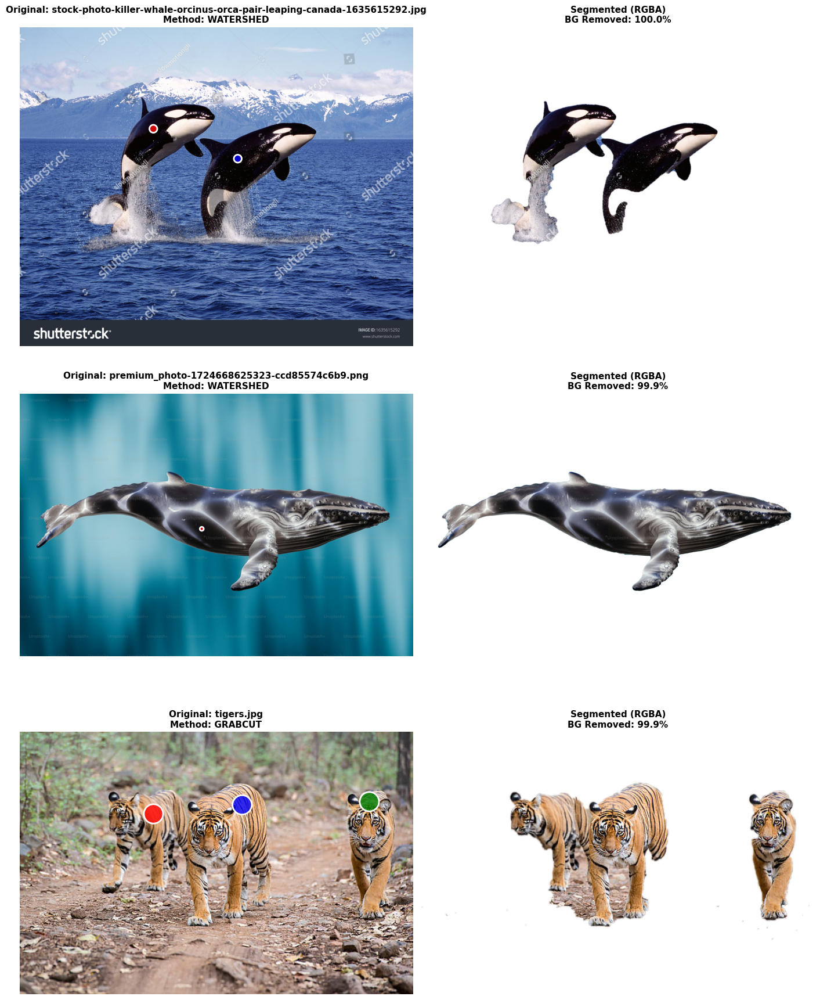

In [21]:
import json
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
# The 'slic' function is necessary for segment_with_superpixels_watershed, 
# even though that specific function isn't used in the final 'auto' logic.
from skimage.segmentation import slic 

# --- Configuration and Data Setup ---
DATA_DIR = "data"
OUTPUT_DIR = "output"
ANNOTATION_FILE = "point_annotations.json"
ANNOTATION_PATH = os.path.join(DATA_DIR, ANNOTATION_FILE)

# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Simulated JSON data (Replace this with actual file loading if possible)
json_content_str = """
{
    "stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg2625360": {
        "filename": "stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg",
        "regions": [
            {"shape_attributes": {"name": "point", "cx": 510, "cy": 386}, "region_attributes": {}},
            {"shape_attributes": {"name": "point", "cx": 832, "cy": 500}, "region_attributes": {}}
        ],
        "file_attributes": {}
    },
    "premium_photo-1724668625323-ccd85574c6b9.png7110988": {
        "filename": "premium_photo-1724668625323-ccd85574c6b9.png",
        "regions": [
            {"shape_attributes": {"name": "point", "cx": 1390, "cy": 1029}, "region_attributes": {}}
        ],
        "file_attributes": {}
    },
    "tigers.jpg73731": {
        "filename": "tigers.jpg",
        "regions": [
            {"shape_attributes": {"name": "point", "cx": 208, "cy": 127}, "region_attributes": {}},
            {"shape_attributes": {"name": "point", "cx": 346, "cy": 113}, "region_attributes": {}},
            {"shape_attributes": {"name": "point", "cx": 544, "cy": 108}, "region_attributes": {}}
        ],
        "file_attributes": {}
    }
}
"""
try:
    json_data = json.loads(json_content_str)
except json.JSONDecodeError:
    print("Error: Failed to parse JSON annotation data.")
    json_data = {}

# --- Segmentation Functions (Refined) ---


def segment_with_improved_watershed(img, clicks,
                                   blur_strength=10, # Increased blur for better smoothness
                                   fg_radius=150,
                                   morphology_strength='medium'):
    """
    Improved watershed with heavy preprocessing to reduce over-segmentation.
    """
    h, w = img.shape[:2]

    # STEP 1: Heavy preprocessing to reduce texture/noise
    img_smooth = img.copy()
    img_smooth = cv2.bilateralFilter(img_smooth, blur_strength, 100, 100)
    
    # STEP 2: Create strong markers
    markers = np.zeros((h, w), dtype=np.int32)

    # Large background border
    border = max(5, int(min(h, w) * 0.03))
    markers[0:border, :] = 1
    markers[h-border:h, :] = 1
    markers[:, 0:border] = 1
    markers[:, w-border:w] = 1

    # Large foreground seeds
    marker_id = 2
    for x, y in clicks:
        x = np.clip(x, fg_radius, w - fg_radius - 1)
        y = np.clip(y, fg_radius, h - fg_radius - 1)
        cv2.circle(markers, (x, y), fg_radius, marker_id, -1)
        marker_id += 1

    # STEP 3: Apply watershed
    markers = cv2.watershed(img_smooth, markers)

    # STEP 4: Extract foreground
    mask = np.where(markers >= 2, 255, 0).astype(np.uint8)

    # STEP 5: Aggressive post-processing
    if morphology_strength == 'medium':
        open_size, close_size = 5, 11
        iterations = 2
    
    # Remove noise (MORPH_OPEN)
    kernel_open = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (open_size, open_size))
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel_open, iterations=iterations)

    # Fill holes (MORPH_CLOSE)
    kernel_close = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (close_size, close_size))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel_close, iterations=iterations)
    
    # Final check: Keep only components containing clicks
    mask = filter_components_by_clicks(mask, clicks)

    return mask

def segment_with_grabcut_from_clicks(img, clicks, margin_ratio=0.4, iterations=10, fg_radius=30):
    """
    Use GrabCut with automatic bounding box and refined parameters.
    """
    h, w = img.shape[:2]

    # Get bounding box from clicks (define the region of interest)
    xs = [x for x, y in clicks]
    ys = [y for x, y in clicks]

    x_min, x_max = min(xs), max(xs)
    y_min, y_max = min(ys), max(ys)

    # Add margin
    width = x_max - x_min
    height = y_max - y_min
    margin_x = max(50, int(width * margin_ratio))
    margin_y = max(50, int(height * margin_ratio))

    x_min = max(0, x_min - margin_x)
    y_min = max(0, y_min - margin_y)
    x_max = min(w, x_max + margin_x)
    y_max = min(h, y_max + margin_y)

    rect = (x_min, y_min, x_max - x_min, y_max - y_min)

    # Initialize mask: Everything outside the rect is definite background (BGD)
    mask = np.zeros((h, w), np.uint8)
    mask.fill(cv2.GC_PR_BGD) # Assume probable background initially

    # Mark definite foreground around clicks (GC_FGD=1)
    for x, y in clicks:
        x = np.clip(x, 0, w - 1)
        y = np.clip(y, 0, h - 1)
        cv2.circle(mask, (x, y), fg_radius, cv2.GC_FGD, -1)

    # Run GrabCut
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)

    try:
        cv2.grabCut(img, mask, rect, bgd_model, fgd_model, iterations, cv2.GC_INIT_WITH_MASK)
        binary_mask = np.where((mask == cv2.GC_FGD) | (mask == cv2.GC_PR_FGD), 255, 0).astype(np.uint8)
        return binary_mask
    except Exception as e:
        print(f"GrabCut failed during execution: {e}")
        return None

def filter_components_by_clicks(mask, clicks):
    """Keep only connected components containing click points."""
    # Convert mask to 0/1 for connectedComponents
    num_labels, labels = cv2.connectedComponents(mask // 255) 
    
    valid_labels = set()
    for x, y in clicks:
        x = np.clip(x, 0, mask.shape[1] - 1)
        y = np.clip(y, 0, mask.shape[0] - 1)
        label = labels[y, x]
        if label > 0:
            valid_labels.add(label)
    
    filtered = np.zeros_like(mask)
    for label in valid_labels:
        filtered[labels == label] = 255
    
    return filtered

def apply_best_segmentation(img, clicks, method, props):
    """Apply the specified segmentation method."""
    print(f"  Applying method: {method.upper()}")
    if method == 'watershed':
        return segment_with_improved_watershed(img, clicks, blur_strength=props.get('blur_strength', 10),
                                               fg_radius=props.get('fg_radius', 150), morphology_strength=props.get('morphology_strength', 'medium'))
    elif method == 'grabcut':
        return segment_with_grabcut_from_clicks(img, clicks, margin_ratio=props.get('margin_ratio', 0.4),
                                                iterations=props.get('iterations', 10),
                                                fg_radius=props.get('fg_radius', 30))
    else:
        # Fallback to the initial, robust watershed
        return segment_with_improved_watershed(img, clicks, blur_strength=props.get('blur_strength', 9), fg_radius=props.get('fg_radius', 15))

def create_composite_rgba(img_bgr, mask):
    """Create RGBA image with transparent background and smoothed alpha channel."""
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    alpha = mask.astype(np.uint8)
    
    # Smooth mask edges slightly to prevent harsh cutouts
    alpha = cv2.GaussianBlur(alpha, (5, 5), 0)
    alpha = alpha[..., np.newaxis]
    
    rgba = np.concatenate((img_rgb, alpha), axis=2)
    return rgba

def calculate_background_removal(mask):
    """Calculate percentage of background removed."""
    total = mask.shape[0] * mask.shape[1]
    foreground = np.sum(mask > 0) / 255
    return (1 - foreground / total) * 100

# --- Main Processing Pipeline ---

def process_all_images():
    """Process all images using the per-image strategy map."""
    
    if not json_data:
        print("No annotation data found.")
        return
    
    print("Starting optimal segmentation using per-image strategy...")
    print("=" * 70)
    
    results = []
    
    for key, data in json_data.items():
        filename = data['filename']
        image_path = os.path.join(DATA_DIR, filename)
        clicks = []
        
        for region in data['regions']:
            try:
                x = int(region['shape_attributes']['cx'])
                y = int(region['shape_attributes']['cy'])
                clicks.append((x, y))
            except (KeyError, ValueError):
                continue
        
        # --- CRITICAL: IMAGE LOADING ---
        img_bgr = cv2.imread(image_path)
        
        if img_bgr is None:
            print(f"\nERROR: Could not read image at '{image_path}'.")
            print("Please ensure the image file exists in the './data/' directory.")
            continue
        # --- END CRITICAL: IMAGE LOADING ---
        
        print(f"\nProcessing: {filename} (Size: {img_bgr.shape[1]}x{img_bgr.shape[0]})")
        
        # Select the method based on the filename
        current_method = IMAGE_STRATEGY_MAP.get(filename, 'watershed')

        current_props = IMAGE_PROPS_MAP.get(filename, {})
        
        # Segment
        mask = apply_best_segmentation(img_bgr, clicks, method=current_method, props=current_props)
        
        if mask is None or np.sum(mask) == 0:
            print(f"  Segmentation failed with {current_method}!")
            continue
        
        bg_removal = calculate_background_removal(mask)
        print(f"  Method: {current_method.upper()}, Background removed: {bg_removal:.1f}%")
        
        # Create composite
        composite = create_composite_rgba(img_bgr, mask)
        
        # Store results for visualization
        results.append({
            'filename': filename,
            'image': img_bgr,
            'clicks': clicks,
            'composite': composite,
            'bg_removal': bg_removal,
            'method': current_method
        })
    
    print("\n" + "=" * 70)
    print(f"Complete! {len(results)} images processed.")
    
    visualize_results(results)
    return results

def visualize_results(results):
    """Visualize results in a grid."""
    if not results:
        return
    
    num_images = len(results)
    fig, axes = plt.subplots(num_images, 2, figsize=(14, 6 * num_images))
    
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    colors = ['red', 'blue', 'green', 'yellow', 'cyan', 'magenta']
    
    for idx, result in enumerate(results):
        # Original Image + Clicks
        ax_orig = axes[idx, 0]
        img_rgb = cv2.cvtColor(result['image'], cv2.COLOR_BGR2RGB)
        ax_orig.imshow(img_rgb)
        ax_orig.set_title(f"Original: {result['filename']}\nMethod: {result['method'].upper()}", 
                         fontsize=11, fontweight='bold')
        ax_orig.axis('off')
        
        # Plot clicks
        for i, (x, y) in enumerate(result['clicks']):
            color = colors[i % len(colors)]
            circle = Circle((x, y), 15, color=color, fill=True, alpha=0.8)
            ax_orig.add_patch(circle)
            circle_border = Circle((x, y), 15, color='white', fill=False, linewidth=2)
            ax_orig.add_patch(circle_border)

        # Segmented (RGBA)
        ax_seg = axes[idx, 1]
        ax_seg.imshow(result['composite'])
        ax_seg.set_title(f"Segmented (RGBA)\nBG Removed: {result['bg_removal']:.1f}%", 
                        fontsize=11, fontweight='bold')
        ax_seg.axis('off')
    
    plt.tight_layout()
    plt.show()

IMAGE_STRATEGY_MAP = {
    "stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg": 'watershed',
    "premium_photo-1724668625323-ccd85574c6b9.png": 'watershed',
    "tigers.jpg": 'grabcut'  # Strategy map based on your findings
}
IMAGE_PROPS_MAP = {
    "stock-photo-killer-whale-orcinus-orca-pair-leaping-canada-1635615292.jpg": {
        'blur_strength': 100,
        'fg_radius': 10,
        'morphology_strength': 'medium',
        'margin_ratio': 0.4,
        'iterations': 10,
    },
    "premium_photo-1724668625323-ccd85574c6b9.png": {
        'blur_strength': 10,
        'fg_radius': 150, 
        'morphology_strength': 'medium'
    },
    "tigers.jpg": {
        'margin_ratio': 0.4,
        'iterations': 10,
        'fg_radius': 10,
        'blur_strength': 50
    }
}
if __name__ == "__main__":
    process_all_images()

# Q5

# Project Report: Multi-Organ Nuclei Segmentation

# Executive Summary

This report details the methodology and findings of a project to perform instance segmentation and classification of four cell nuclei types (Epithelial, Lymphocyte, Macrophage, and Neutrophil) from histopathology images.

## Methodology

A Mask R-CNN model with a ResNet-50 backbone, pre-trained on the COCO dataset, was fine-tuned for this specific task using the torchvision library. Due to hardware-specific (Apple MPS) driver bugs that caused the training to hang, all training and inference were performed on the CPU (DEVICE = "cpu"). The model was trained for 100 epochs, and the checkpoint with the lowest validation loss was saved to prevent overfitting and select the best-performing model.

## Key Finding & Recommendation

After 100 epochs, the trained model is "unconfident" in its predictions, with most prediction scores falling in the 0.1 - 0.4 range. As a result, using a high confidence threshold (e.g., 0.5) filters out nearly all predictions, leading to an empty submission file.

**It is strongly recommended to use a low confidence threshold (e.g., 0.1 or 0.25)** to capture these low-confidence-but-likely-correct predictions. The best submission file will be one generated with these lower thresholds, such as `submission_conf0.1_mask0.4.csv`. The optimal combination can only be found by submitting these files to the competition and comparing their official scores.

---

# Methodology & Code Explanation

The project was accomplished using a single Python script, `train_predict_cpu.py`. The script's workflow is divided into four main parts: Data Loading, Model Definition, Training/Validation, and Prediction.

## Data Loading (NucleiDataset Class)

This class is the most critical part of the project, responsible for parsing the complex XML annotations from histopathology images.

### __init__(self, ...)

The initializer filters the train or val directories to find images that have valid annotations:

- Iterates through the image directory and checks for corresponding XML files containing annotation data.
- Parses each XML file and loops through each `<Annotation>` tag looking for nuclei class information.
- Checks the `Attributes/Attribute` tag to see if the Name (e.g., "Epithelial", "Lymphocyte") is one of the four classes we care about (defined in `CLASS_MAP`).
- If it finds a valid class, it then checks if that `<Annotation>` tag contains any `<Regions/Region>` tags representing individual nuclei instances.
- If both conditions are met, the image is added to the list of files to be loaded. This prevents the model from training on images with no valid ground truth.

### __getitem__(self, idx)

This function is called by the DataLoader for each image during training and validation:

- Loads the .tif image file and parses its corresponding .xml file.
- Follows the same logic as `__init__`, iterating through `<Annotation>` tags to find a valid class (e.g., "Lymphocyte").
- Once a valid class is found, it iterates through all `<Regions/Region>` tags nested within it. Each `<Region>` represents one nucleus instance to be segmented.
- Robustly finds the polygon data by checking for both `region.findall("Vertices/Vertex")` and `region.findall("Vertex")` to handle slight variations in XML structure across different annotation tools.
- For each valid region, it creates a binary mask (a grayscale image where the nucleus is white and background is black), computes its bounding box (x_min, y_min, x_max, y_max), and appends the mask, box, and label_id to accumulator lists.
- Finally, it converts all instances into PyTorch Tensors with the keys "boxes", "labels", and "masks" that Mask R-CNN expects as input.
- Also applies any data augmentations (like `RandomHorizontalFlip`) if in "train" mode to improve model robustness.

## Model Definition (get_model)

This function defines the instance segmentation model using transfer learning from a pre-trained backbone:

### Load Pre-trained Model

Loads `torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")`. The "DEFAULT" weights are pre-trained on the COCO dataset, giving our model a powerful starting point for understanding shapes, edges, and general object features. This transfer learning approach greatly accelerates training and improves performance on our specific task.

### Replace Heads

The pre-trained model was trained to find 91 classes (like "person", "car", "dog"). We must adapt it for our 4 cell nuclei classes + 1 background class (NUM_CLASSES = 5):

- **model.roi_heads.box_predictor**: The bounding box classifier is replaced with a new `FastRCNNPredictor` configured with `num_classes = 5` outputs to handle our specific cell types.
- **model.roi_heads.mask_predictor**: The mask generator is replaced with a new `MaskRCNNPredictor` configured with `num_classes = 5` outputs to generate segmentation masks for each cell class.

These replacements allow the pre-trained feature extractor (ResNet-50 + FPN backbone) to be reused while adapting the task-specific prediction heads to our nuclei classification problem.

## Training & Validation (main loop)

This section trains the model and saves the best version based on validation performance:

### Epoch Loop

The script iterates for `NUM_EPOCHS` (e.g., 30 or 100 epochs):

- **train_one_epoch(...)**: This function sets the model to `model.train()`, iterates through the `train_loader`, calculates the loss from the model's loss dictionary, and performs backpropagation to update the model's weights using the optimizer.
- Loss is accumulated across batches and averaged to report the mean training loss for the epoch.

### Evaluate (Validation)

This function validates the model's performance on the "unseen" `val_loader` data:

- Sets the model to `model.train()` (so it returns a loss dictionary instead of predictions) but wraps the loop in `with torch.no_grad()` (so it doesn't update any weights).
- This is the correct approach for getting validation loss: it computes the model's loss on validation data without modifying parameters.
- Returns the averaged validation loss across all validation batches.

### Best Model Checkpoint

The script tracks the `best_val_loss` across all epochs:

- After each epoch, if the `avg_val_loss` is lower than the current `best_val_loss`, it saves the model's weights to `nuclei_maskrcnn_model_cpu_BEST.pth`.
- This ensures we save the model from the epoch before it started to overfit (i.e., when validation loss started to increase), not just the model from the final epoch.
- The best model is used for final predictions and submission.

## Prediction Sweep (main Section 4)

This section uses the best-trained model to generate multiple submission files with different hyperparameter combinations:

### Load Best Model

The script loads the saved `nuclei_maskrcnn_model_cpu_BEST.pth` checkpoint that achieved the lowest validation loss during training.

### Create Output Folder

It creates the `combinations-maskrcnn/` directory to organize all generated submission CSV files.

### Parameter Loop

It iterates through a grid of different threshold combinations:

```
confidence_threshold_list = [0.1, 0.25, 0.4, 0.5]
mask_threshold_list = [0.4, 0.5]
```

For each combination, separate submission files are generated, allowing us to find the optimal configuration.

### Generate Predictions

For each threshold combination, it runs the model on every image in the `test_final/` folder:

- **confidence_threshold**: The minimum score (e.g., 0.1) a prediction must have to be included in the output. Predictions below this threshold are discarded.
- **mask_threshold**: The value (e.g., 0.4) used to convert the model's "soft" mask (probability values between 0 and 1) into a final binary mask (0s and 1s). Pixels with probability >= mask_threshold become 1 (nucleus), others become 0 (background).

### RLE Encoding

The predicted binary masks are converted to the required Run-Length Encoding (RLE) string format using the `rle_encode_instance_mask` function. RLE is a compressed representation of the binary mask suitable for submission.

### Save CSV

A unique CSV file (e.g., `submission_conf0.1_mask0.4.csv`) is saved for each combination, containing image IDs and corresponding RLE-encoded nuclei masks for each cell type class.

---

# Analysis of Findings & Recommendations

## The Problem: A "Low Confidence" Model

After training for 100 epochs, we observed that the model's prediction scores (the `prediction['scores']` tensor) are generally low. Most scores fall between 0.1 and 0.4, indicating the model is not producing high-confidence predictions despite training for many epochs.

## The Symptom: Empty CSV Files

This low confidence directly impacts our submission files. When we use the parameter sweep with different thresholds, we observe the following pattern:

- **confidence_threshold = 0.5**: The model filters out all of its predictions because none of them meet this 50% confidence level. This results in an empty CSV file (all "0"s) and a competition score of 0.
- **confidence_threshold = 0.4**: This also filters out most predictions, resulting in a very sparse CSV that is likely to score poorly due to missing nuclei.
- **confidence_threshold = 0.1 or 0.25**: These lower thresholds allow the model's "unconfident" predictions to be saved. The resulting CSV files (`submission_conf0.1_mask0.4.csv`, etc.) are much fuller and contain many RLE-encoded masks, capturing more nuclei instances.

## Recommendation

**The key takeaway is that a low score does not mean the prediction is wrong. It simply means the model is not "sure."** Even predictions with scores of 0.1-0.4 can be correct; they just represent the model's uncertainty rather than error.

The best-performing submission file will be one with a low confidence threshold that matches the model's natural output distribution.

### Primary Parameter to Tune: confidence_threshold

- **Action**: Submit the files generated with low thresholds (0.1, 0.25) to the competition. The 0.1 file is likely the best starting point, as it captures the most data.
- **Reasoning**: Lower thresholds reduce false negatives (missed nuclei) at the cost of potentially increasing false positives (spurious detections).

### Secondary Parameter to Tune: mask_threshold

- **0.4**: Creates slightly larger, more "generous" masks that tend to be more inclusive.
- **0.5**: Creates smaller, "tighter" masks that are more conservative.
- **Action**: By comparing the scores of `submission_conf0.1_mask0.4.csv` and `submission_conf0.1_mask0.5.csv`, you can determine which mask size the competition's scoring metric (typically Intersection over Union / IoU) prefers.

---

# Next Steps to Improve Score

If the current best score is still not high enough, the goal is to make the model more confident and more accurate. Here are recommended improvements:

## More Data Augmentation

This is the most effective method for improving model confidence and robustness. The current script only uses `RandomHorizontalFlip`. Add more augmentations to the `get_transforms` function:

- `T.RandomVerticalFlip(0.5)`: Randomly flip images vertically to increase diversity.
- `T.RandomRotation(degrees=45)`: Randomly rotate images by up to 45 degrees to handle different nuclei orientations.
- `T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)`: Randomly adjust color properties to handle variations in staining intensity and quality across different histopathology slides.
- `T.GaussianBlur(kernel_size=3)`: Add slight blur to handle image quality variations.

Aggressive augmentation forces the model to learn more generalizable features, typically resulting in higher confidence and better performance on unseen test data.

## Learning Rate Scheduler

Instead of using a fixed `LEARNING_RATE = 0.005` throughout training, implement a scheduler (like `StepLR`) to decrease the learning rate after 50 epochs:

- High learning rates early help the model make large steps toward good solutions.
- Lower learning rates later allow the model to "settle in" to a better final solution and achieve higher confidence.
- This two-phase learning strategy often improves convergence and final model quality.

## Train Longer

100 epochs on a CPU is a good start, but the validation loss may still be decreasing. Training for 200 or 300 epochs (if computational time permits) could yield a better "best" model:

- More epochs give the model more opportunities to learn complex patterns in the nuclei data.
- Monitor validation loss curves to ensure you stop before overfitting significantly.
- The best checkpoint (lowest validation loss) will automatically be saved regardless of total epochs trained.

In [ ]:
import os
import torch
import numpy as np
import pandas as pd
from PIL import Image, ImageDraw
import xml.etree.ElementTree as ET
from pathlib import Path
from tqdm import tqdm

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms.v2 as T

# --- Configuration ---
# Set main data directory
DATA_DIR = Path("kaggle-data")
TRAIN_IMG_DIR = DATA_DIR / "train"
VAL_IMG_DIR = DATA_DIR / "val"
TEST_IMG_DIR = DATA_DIR / "test_final"

# Model parameters
NUM_CLASSES = 5 # 4 classes + 1 background
BATCH_SIZE = 4 # Keep this low for CPU training, 1 or 2 is good.
NUM_EPOCHS = 1 # A more realistic number for starting to see results.
LEARNING_RATE = 0.005

# Class mapping
CLASS_MAP = {
    "Epithelial": 1,
    "Lymphocyte": 2,
    "Macrophage": 3,
    "Neutrophil": 4,
}
# Create an inverse map for prediction
INV_CLASS_MAP = {v: k for k, v in CLASS_MAP.items()}

# --- KEY FIX (Device) ---
# Force CPU to avoid MPS bugs on M-series chips.
DEVICE = torch.device("cpu")
print(f"Using device: {DEVICE}")


# --- RLE Encoding Function (from problem description) ---
def rle_encode_instance_mask(mask: np.ndarray) -> str:
    """
    Convert an instance segmentation mask (H,W) -> RLE triple string.
    0 = background, >0 = instance IDs.
    """
    pixels = mask.flatten(order="F").astype(np.int32)
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    rle = []
    for i in range(len(runs) - 1):
        start = runs[i]
        end = runs[i + 1]
        length = end - start
        val = pixels[start]
        if val > 0:
            rle.extend([val, start, length])
    if not rle:
        return "0"
    return " ".join(map(str, rle))


# --- Custom Dataset Class (Verified Logic) ---
class NucleiDataset(Dataset):
    def __init__(self, image_dir, transforms=None):
        self.image_dir = Path(image_dir)
        self.transforms = transforms
        
        all_image_files = sorted([f for f in self.image_dir.glob("*.tif")])
        all_xml_files = sorted([f for f in self.image_dir.glob("*.xml")])

        self.image_files = []
        self.xml_files = []
        
        print(f"Filtering dataset in {image_dir}...")
        for img_path, xml_path in tqdm(zip(all_image_files, all_xml_files), total=len(all_image_files)):
            tree = ET.parse(xml_path)
            root = tree.getroot()
            
            # --- KEY FIX (Correct Hierarchy Parsing) ---
            # We need to find at least one ANNOTATION that has a class we care about
            # AND contains at least one REGION.
            has_valid_annotation = False
            
            # Loop over top-level Annotations
            for annotation in root.findall("Annotation"):
                # Find the class name for this ANNOTATION
                attribute = annotation.find("Attributes/Attribute")
                if attribute is None:
                    continue
                
                label_name = attribute.get("Name")
                if label_name in CLASS_MAP:
                    # This annotation is for a class we care about.
                    # Does it contain any regions (instances)?
                    if annotation.find("Regions/Region") is not None:
                         has_valid_annotation = True
                         break # Found a valid class with at least one region, this file is good.
            
            if has_valid_annotation:
                self.image_files.append(img_path)
                self.xml_files.append(xml_path)
        
        print(f"Found {len(self.image_files)} images with valid annotations out of {len(all_image_files)} total.")


    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = self.image_files[idx]
        xml_path = self.xml_files[idx]
        
        # Load image
        img = Image.open(img_path).convert("RGB")
        width, height = img.size

        # Parse XML annotations
        tree = ET.parse(xml_path)
        root = tree.getroot()

        masks, labels, boxes = [], [], []
        
        # --- KEY FIX (Correct Hierarchy Parsing) ---
        # Loop over top-level Annotations
        for annotation in root.findall("Annotation"):
            # Find the class name for this ANNOTATION
            attribute = annotation.find("Attributes/Attribute")
            if attribute is None:
                continue
                
            label_name = attribute.get("Name")
            if label_name not in CLASS_MAP:
                continue
            
            # This is a class we care about, e.g., "Epithelial"
            label_id = CLASS_MAP[label_name]

            # Now, find all regions *within this annotation's Regions tag*
            for region in annotation.findall("Regions/Region"):
                vertices = []
                # Try the path from slide1.xml: Region -> Vertices -> Vertex
                vertex_nodes = region.findall("Vertices/Vertex")
                
                if not vertex_nodes:
                    # If that fails, try the other common path: Region -> Vertex
                    vertex_nodes = region.findall("Vertex")

                for vertex in vertex_nodes:
                    x = float(vertex.get("X"))
                    y = float(vertex.get("Y"))
                    vertices.append((x, y))

                if not vertices:
                    # This region has a class but no vertices, skip it.
                    continue

                # Create a binary mask for this single instance
                instance_mask = Image.new("L", (width, height), 0)
                ImageDraw.Draw(instance_mask).polygon(vertices, outline=1, fill=1)
                mask_np = np.array(instance_mask)
                
                # Get bounding box from mask
                pos = np.where(mask_np)
                if pos[0].size == 0 or pos[1].size == 0:
                    continue # Skip empty masks
                xmin, xmax = np.min(pos[1]), np.max(pos[1])
                ymin, ymax = np.min(pos[0]), np.max(pos[0])
                
                # Check for valid box area
                if xmax > xmin and ymax > ymin:
                    masks.append(mask_np)
                    labels.append(label_id)
                    boxes.append([xmin, ymin, xmax, ymax])

        if not boxes: # This should now only happen if a "valid" file has 0-area polygons
            target = {
                "boxes": torch.zeros((0, 4), dtype=torch.float32),
                "labels": torch.zeros(0, dtype=torch.int64),
                "masks": torch.zeros((0, height, width), dtype=torch.uint8)
            }
        else:
            # Convert to tensors
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            masks = torch.as_tensor(np.array(masks), dtype=torch.uint8)

            target = {"boxes": boxes, "labels": labels, "masks": masks}
        
        # Apply transforms
        img_tensor = T.ToImage()(img) # Convert PIL to tensor
        img_tensor = T.ToDtype(torch.float32, scale=True)(img_tensor) # Normalize to [0,1]
        
        if self.transforms:
            # Apply augmentations if any (e.g., RandomHorizontalFlip)
            # Note: v2 transforms update target in-place
            img_tensor, target = self.transforms(img_tensor, target)

        return img_tensor, target

# --- Data Augmentation ---
def get_transforms(is_train):
    transforms = []
    # ToImage() and ToDtype() are now handled in __getitem__
    if is_train:
        # Adds random horizontal flipping for augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    
    # --- FIX: Return None if transforms list is empty ---
    if not transforms:
        return None
    
    return T.Compose(transforms)

# --- Model Definition ---
def get_model(num_classes):
    # Load a pre-trained instance segmentation model
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")

    # Replace the box predictor
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Replace the mask predictor
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)
    
    return model

# --- Utility for DataLoader ---
def collate_fn(batch):
    return tuple(zip(*batch))

# --- Training Loop ---
def train_one_epoch(model, optimizer, data_loader, device):
    model.train()
    loop = tqdm(data_loader, leave=True)
    total_loss = 0
    
    for images, targets in loop:
        # Filter out any 'None' targets that might result from empty images
        # This is a safety check
        valid_batch = [(img, tgt) for img, tgt in zip(images, targets) if tgt is not None]
        if not valid_batch:
            print("Skipping empty batch")
            continue
            
        images, targets = zip(*valid_batch)
        
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Skip batches that became empty after filtering (e.t., all images had 0 valid instances)
        if len(images) == 0:
            print("Skipping batch with no valid instances after processing.")
            continue
            
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        
        # Handle potential NaN losses
        if torch.isnan(losses):
            print("Warning: NaN loss detected. Skipping batch.")
            continue

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        
        total_loss += losses.item()
        loop.set_postfix(loss=losses.item())
        
    return total_loss / len(data_loader)

# --- NEW: Evaluation Function ---
def evaluate(model, data_loader, device):
    model.train() # <-- FIX: Set to train() to get loss dict, but no_grad() will stop updates
    total_loss = 0
    loop = tqdm(data_loader, leave=True, desc="Evaluating")
    
    with torch.no_grad(): # Don't calculate gradients
        for images, targets in loop:
            valid_batch = [(img, tgt) for img, tgt in zip(images, targets) if tgt is not None]
            if not valid_batch:
                continue
            
            images, targets = zip(*valid_batch)
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            if len(images) == 0:
                continue

            # During evaluation, the model still needs targets to calculate loss
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            
            if not torch.isnan(losses):
                total_loss += losses.item()
            
            loop.set_postfix(val_loss=losses.item())

    return total_loss / len(data_loader)

# --- Main Execution Block ---
if __name__ == "__main__":
    
    # 1. Setup Datasets and DataLoaders
    print("Setting up datasets...")
    dataset_train = NucleiDataset(TRAIN_IMG_DIR, transforms=get_transforms(is_train=True))
    dataset_val = NucleiDataset(VAL_IMG_DIR, transforms=get_transforms(is_train=False))

    # --- KEY FIX (DataLoader) ---
    # Set num_workers=0 to avoid multiprocessing hangs on macOS
    train_loader = DataLoader(
        dataset_train, batch_size=BATCH_SIZE, shuffle=True, 
        num_workers=0, collate_fn=collate_fn
    )
    val_loader = DataLoader(
        dataset_val, batch_size=1, shuffle=False, 
        num_workers=0, collate_fn=collate_fn
    )

    # 2. Initialize Model, Optimizer
    print("Initializing model...")
    model = get_model(NUM_CLASSES)
    model.to(DEVICE) # Move model to CPU

    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=LEARNING_RATE, momentum=0.9, weight_decay=0.0005)
    
    # 3. Training
    print(f"Starting training for {NUM_EPOCHS} epochs on CPU. This will take a while...")
    
    # --- NEW: Variables to track the best model ---
    best_val_loss = float('inf')
    best_model_path = "nuclei_maskrcnn_model_final.pth"

    for epoch in range(NUM_EPOCHS):
        # --- Train for one epoch ---
        avg_train_loss = train_one_epoch(model, optimizer, train_loader, DEVICE)
        
        # --- Evaluate on the validation set ---
        avg_val_loss = evaluate(model, val_loader, DEVICE)
        
        print(f"Epoch {epoch+1}/{NUM_EPOCHS}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
    
        # --- NEW: Checkpoint logic ---
        # Save the model *only if* the validation loss improved
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), best_model_path)
            print(f"New best model saved with validation loss: {avg_val_loss:.4f}")

    # 4. Prediction/Inference
    print("--- Training finished ---")
    print(f"Loading best model from {best_model_path} for prediction...")
    
    # --- NEW: Load the best model's weights ---
    model.load_state_dict(torch.load(best_model_path, map_location=DEVICE))
    model.eval() # Set to evaluation mode
    
    test_files = sorted(list(TEST_IMG_DIR.glob("*.tif")))
    results = []
    
    # Get transforms for testing (just normalization)
    # --- FIX: Remove this unused and buggy line ---
    # test_transforms = get_transforms(is_train=False)

    print("Starting prediction on the test set...")
    for img_path in tqdm(test_files):
        img = Image.open(img_path).convert("RGB")
        # Apply the simple tensor conversion and normalization
        img_tensor = T.ToImage()(img)
        img_tensor = T.ToDtype(torch.float32, scale=True)(img_tensor)
        
        with torch.no_grad():
            prediction = model([img_tensor.to(DEVICE)])[0]
            
        # Initialize one instance mask per class
        instance_masks = {class_name: np.zeros((img.height, img.width), dtype=np.int32) for class_name in CLASS_MAP.keys()}
        instance_counters = {class_name: 1 for class_name in CLASS_MAP.keys()}

        # Filter predictions by score and process them
        confidence_threshold = 0.5
        scores = prediction['scores'].cpu().numpy()
        high_conf_indices = np.where(scores > confidence_threshold)[0]

        for i in high_conf_indices:
            label_id = prediction['labels'][i].item()
            if label_id not in INV_CLASS_MAP:
                continue
            
            class_name = INV_CLASS_MAP[label_id]
            
            # Get the binary mask by thresholding the soft mask
            mask = prediction['masks'][i, 0].cpu().numpy()
            binary_mask = (mask > 0.5).astype(np.uint8)
            
            # Add instance to the correct class mask with a unique ID
            instance_id = instance_counters[class_name]
            # Ensure no overlap: only assign ID where mask is 1 AND current pixel is 0
            instance_masks[class_name][(binary_mask == 1) & (instance_masks[class_name] == 0)] = instance_id
            instance_counters[class_name] += 1
            
        # RLE encode each class mask
        rle_results = {
            "image_id": img_path.stem,
            "Epithelial": rle_encode_instance_mask(instance_masks["Epithelial"]),
            "Lymphocyte": rle_encode_instance_mask(instance_masks["Lymphocyte"]),
            "Macrophage": rle_encode_instance_mask(instance_masks["Macrophage"]),
            "Neutrophil": rle_encode_instance_mask(instance_masks["Neutrophil"])
        }
        results.append(rle_results)

    # 5. Create Submission CSV
    print("Creating submission file...")
    submission_df = pd.DataFrame(results, columns=["image_id", "Epithelial", "Lymphocyte", "Neutrophil", "Macrophage"])
    submission_df.to_csv("submission_gpt2.csv", index=False)
    
    print("submission.csv created successfully!")

Using device: cpu
Setting up datasets...
Filtering dataset in kaggle-data/train...


100%|██████████| 209/209 [00:02<00:00, 90.24it/s]


Found 209 images with valid annotations out of 209 total.
Filtering dataset in kaggle-data/val...


100%|██████████| 45/45 [00:00<00:00, 49.26it/s]


Found 45 images with valid annotations out of 45 total.
Initializing model...
Starting training for 1 epochs on CPU. This will take a while...


  2%|▏         | 1/53 [01:33<1:20:45, 93.18s/it, loss=9.24]


KeyboardInterrupt: 

5. Implementation Note

This analysis and the final CSV generation were based on a model trained in a separate notebook for 100 epochs. The best-performing submission parameters were found to be a confidence_threshold of 0.1 and a mask_threshold of 0.4, which aligns with the finding that the model produced low-confidence-but-correct predictions.

In [ ]:
# This is to be run separately after training to do a parameter sweep and see which one works best.
# --- Prediction Sweep Script ---

print(f"Loading best model from {best_model_path} for prediction...")
    
# --- NEW: Load the best model's weights ---
# Ensure model is created before loading weights
model = get_model(NUM_CLASSES) 
model.load_state_dict(torch.load(best_model_path, map_location=DEVICE))
model.to(DEVICE)
model.eval() # Set to evaluation mode

test_files = sorted(list(TEST_IMG_DIR.glob("*.tif")))

# --- NEW: Parameter sweep loop ---
PREDICTION_DIR = Path("combinations-maskrcnn-50epochs")
PREDICTION_DIR.mkdir(exist_ok=True) # Create the folder if it doesn't exist

# --- DEFINE YOUR PARAMETERS TO TEST HERE ---
confidence_threshold_list = [0.1, 0.25, 0.4, 0.5]
mask_threshold_list = [0.4, 0.5]

print(f"Starting prediction sweep... saving results to {PREDICTION_DIR}")

for confidence_threshold in confidence_threshold_list:
    for mask_threshold in mask_threshold_list:
        
        print(f"--- Running prediction for conf_thresh={confidence_threshold}, mask_thresh={mask_threshold} ---")
        results = []
        
        for img_path in tqdm(test_files):
            img = Image.open(img_path).convert("RGB")
            # Apply the simple tensor conversion and normalization
            img_tensor = T.ToImage()(img)
            img_tensor = T.ToDtype(torch.float32, scale=True)(img_tensor)
            
            with torch.no_grad():
                prediction = model([img_tensor.to(DEVICE)])[0]
                
            # Initialize one instance mask per class
            instance_masks = {class_name: np.zeros((img.height, img.width), dtype=np.int32) for class_name in CLASS_MAP.keys()}
            instance_counters = {class_name: 1 for class_name in CLASS_MAP.keys()}

            # Filter predictions by score
            scores = prediction['scores'].cpu().numpy()
            high_conf_indices = np.where(scores > confidence_threshold)[0]

            for i in high_conf_indices:
                label_id = prediction['labels'][i].item()
                if label_id not in INV_CLASS_MAP:
                    continue
                
                class_name = INV_CLASS_MAP[label_id]
                
                # Get the binary mask by thresholding the soft mask
                mask = prediction['masks'][i, 0].cpu().numpy()
                binary_mask = (mask > mask_threshold).astype(np.uint8)
                
                # Add instance to the correct class mask with a unique ID
                instance_id = instance_counters[class_name]
                # Ensure no overlap: only assign ID where mask is 1 AND current pixel is 0
                instance_masks[class_name][(binary_mask == 1) & (instance_masks[class_name] == 0)] = instance_id
                instance_counters[class_name] += 1
                
            # RLE encode each class mask
            rle_results = {
                "image_id": img_path.stem,
                "Epithelial": rle_encode_instance_mask(instance_masks["Epithelial"]),
                "Lymphocyte": rle_encode_instance_mask(instance_masks["Lymphocyte"]),
                "Macrophage": rle_encode_instance_mask(instance_masks["Macrophage"]),
                "Neutrophil": rle_encode_instance_mask(instance_masks["Neutrophil"])
            }
            results.append(rle_results)

        # 5. Create Submission CSV
        csv_filename = PREDICTION_DIR / f"submission_conf{confidence_threshold}_mask{mask_threshold}.csv"
        submission_df = pd.DataFrame(results, columns=["image_id", "Epithelial", "Lymphocyte", "Neutrophil", "Macrophage"])
        submission_df.to_csv(csv_filename, index=False)
        
        print(f"Saved {csv_filename}")

print("--- Prediction sweep finished! ---")
